In [1]:
# Conectar google colab con google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
dataset_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/'

In [3]:
cp -r /content/drive/MyDrive/APSE/4.2.2_kitti_dataset/utils /content

In [4]:
label_folder = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/labels_od_2D'

In [5]:
!pip install -U ultralytics

In [6]:
import os
from collections import Counter
import cv2
import glob

class_counter = Counter()

# Recorrer todos los archivos de anotaciones
for filename in os.listdir(label_folder):
    if filename.endswith('.txt'):
        with open(os.path.join(label_folder, filename), 'r') as file:
            for line in file:
                if line.strip():
                    class_name = line.split()[0]
                    class_counter[class_name] += 1

# Mostrar resultados
print("Clases encontradas y sus frecuencias:")
for cls, count in class_counter.items():
    print(f"{cls}: {count}")


Clases encontradas y sus frecuencias:
Car: 733
Van: 66
DontCare: 430
Pedestrian: 104
Truck: 24
Cyclist: 46
Tram: 22
Misc: 23
Person_sitting: 11


cuantas etiquetas hay de cada clase en el fichero labels con un contador y las imprime

ESTO TARDA 4 MINUTOS

In [7]:
from ultralytics import YOLO
import cv2
from ultralytics.utils.plotting import Annotator
from google.colab.patches import cv2_imshow
import glob
import random

model = YOLO('yolov8l.pt')

# Obtener todas las imágenes del dataset
images_paths = sorted(glob.glob(dataset_path + "kitti_data/images_od/*.png"))

# Lista para almacenar todas las clases detectadas
all_detected_classes = []

# Procesar cada imagen
for img_path in images_paths:
    # Leer la imagen
    frame = cv2.imread(img_path)
    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

    # Predecir con YOLO
    results = model.predict(img, verbose=False)

    # Extraer las clases detectadas
    for r in results:
        boxes = r.boxes
        for box in boxes:
            c = int(box.cls)
            class_name = model.names[c]
            all_detected_classes.append(class_name)

# Contar cuántas veces se detectó cada clase
class_counts = Counter(all_detected_classes)

# Mostrar el resumen
print("Clases detectadas en TODO el dataset y su frecuencia:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")



Clases detectadas en TODO el dataset y su frecuencia:
person: 154
bicycle: 119
motorcycle: 7
train: 8
car: 857
truck: 67
traffic light: 78
stop sign: 14
potted plant: 14
bus: 20
fire hydrant: 3
handbag: 7
chair: 9
dining table: 4
umbrella: 4
boat: 1
backpack: 1


Usa las imagenes de Kitti, pero en lugar de anotaciones, usa deteccion automatica con el modelo YOLO

Yolo detecta mas coches de los que hay anotados, esto puede deberse a falsos positivos.

En las personas hay muchas mas detectadas de las que hay anotadas, esto se puede deber a que muchas no estarían anotadas o confusion con otras clases, por ejemplo Kitti detecta al conjunto de bicicleta y persona, pero Yolo las detecta por separado, esto puede hacer que detecte muchas mas personas que Kitti.


**Los dos datasets cuentan con la clase "car" y "truck", sin embargo Kitti cuenta con la clase "van", que no esta entre las clases de YOLO, como en algunos casos esto podria producir errores no tendremos en cuenta esta clase.**

**Las clases "tram" y "train" probablemente podrían considerarse la misma sin problemas, sin embargo la clase "bus" nos da más problemas al no estar en kitti, como no hay una clase clara a la que igualarla, no la consideraremos.**

**Las últimas clases que haremos match serán "person_sitting" y "pedestrian" con "person", así como "bicycle" con "cyclist" (aunque esta probablemente de problemas si la clase "cyclist" identifica a personas montadas en una bici y la clase "bicycle" solo al propio vehiculo, cosa que es bastante posible considerando la diferencia que hemos obtenido en la cantidad de detecciones de las dos clases)**

In [8]:
class_mapping = {
    'Car': 'car',
    'Tram' : 'train',
    'Person_sitting' : 'person',
    'Pedestrian': 'person',
    'Truck': 'truck',
    'Cyclist': 'bicycle'
}

# Filtrar clases relevantes de YOLO (eliminando las irrelevantes)
relevant_yolo_classes = ['car', 'person', 'truck','train', 'bicycle']

**Primero probamos con unas pocas imagenes comparando las anotaciones de KITTI y las de YOLO, en el caso de las anotaciones de YOLO nos quedamos solo con las relevantes (aquellas que tienen un equivalente en KITTI) mientras que en el caso de KITTI nos quedaremos con todas (para poder observar que clases son las que se confunden más unas con otras)**


📌 Clases relevantes anotadas en KITTI: {'person'}
📌 Clases relevantes detectadas por YOLO: {'person'}

✅ Sin falsos positivos
✅ Sin falsos negativos


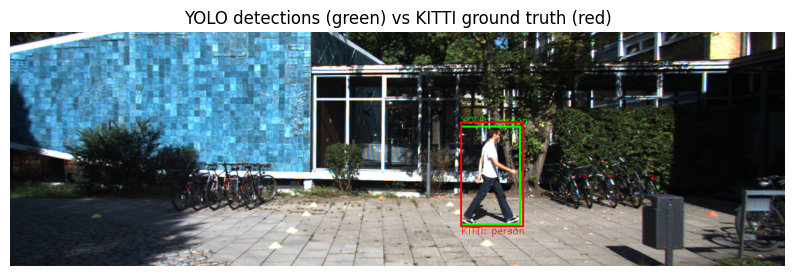

In [9]:
import cv2
from ultralytics import YOLO

# Rutas
image_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/images_od/000000.png'
label_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/labels_od_2D/000000.txt'

# Modelo YOLO cargado
model = YOLO('yolov8l.pt')

# --- 1. Mapeo entre clases ---
class_mapping = {
    'Car': 'car',
    'Tram': 'train',
    'Person_sitting': 'person',
    'Pedestrian': 'person',
    'Truck': 'truck'
}
relevant_yolo_classes = ['car', 'person', 'truck', 'train']

# --- 2. Cargar imagen ---
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_copy = img.copy()

# --- 3. Detección con YOLO ---
results = model.predict(img_rgb, verbose=False)[0]
yolo_detected = []

for box in results.boxes:
    cls = model.names[int(box.cls)]
    if cls in relevant_yolo_classes:
        yolo_detected.append(cls)
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_copy, f"YOLO: {cls}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

yolo_detected_set = set(yolo_detected)

# --- 4. Leer anotaciones KITTI ---
kitti_classes = []
with open(label_path, 'r') as f:
    for line in f:
        parts = line.strip().split()
        original_class = parts[0]
        mapped_class = class_mapping.get(original_class)
        if mapped_class in relevant_yolo_classes:
            kitti_classes.append(mapped_class)
            # Coordenadas KITTI: left, top, right, bottom
            x1, y1, x2, y2 = map(int, map(float, parts[4:8]))
            cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 0, 255), 2)
            cv2.putText(img_copy, f"KITTI: {mapped_class}", (x1, y2 + 12), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

kitti_classes_set = set(kitti_classes)

# --- 5. Comparación ---
false_positives = yolo_detected_set - kitti_classes_set
false_negatives = kitti_classes_set - yolo_detected_set

# --- 6. Mostrar resumen ---
print(f"\n📌 Clases relevantes anotadas en KITTI: {kitti_classes_set}")
print(f"📌 Clases relevantes detectadas por YOLO: {yolo_detected_set}\n")

if false_positives:
    print(f"❌ Falsos positivos (YOLO detectó, pero no están en KITTI): {false_positives}")
else:
    print("✅ Sin falsos positivos")

if false_negatives:
    print(f"❌ Falsos negativos (estaban en KITTI, pero YOLO no detectó): {false_negatives}")
else:
    print("✅ Sin falsos negativos")

# --- 7. Mostrar imagen con OpenCV (o matplotlib si estás en notebook) ---
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("YOLO detections (green) vs KITTI ground truth (red)")
plt.show()



se cragan las imagenes, se aplica el Yolo yse leen las anotaciones verdaderas, se mapean al vocabulario de Yolo y se dibujan cajas rojas para marcar lo que se identifica.

Luego se identifican los falsos positivos (Yolo deteccta clases que no estan en Kiti) y falsos negativos (clases en Kiti que Yolo no detectó).

Con este codigo solo se consideran las clases mapeadas y descarta el resto, por lo que si por ejemplo Kiti anota una Van no se analiza porque no esta mapeado en Yolo.

**Con esta representación lo único que se nos ocurrió que podía faltar son las anotaciones de KITTI que no tienen un equivalente en YOLO (van, cyclist...) ya que en los casos en los que YOLO coincide con las anotaciones de KITTI con esto nos vale, pero si falla en alguna detección estaría bien saber si la ha confundido con alguna cosa que ya está anotada en KITTI (por ejemplo identificar una camioneta con un coche normal)**


📌 Clases relevantes anotadas en KITTI (mapeadas): {'person'}
📌 Clases relevantes detectadas por YOLO: {'person'}

✅ Sin falsos positivos
✅ Sin falsos negativos


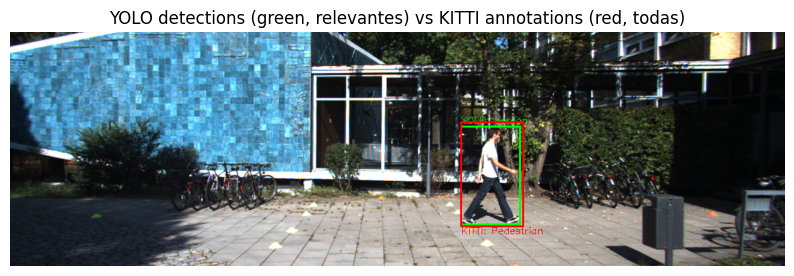

In [10]:
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_copy = img.copy()

# --- Detección con YOLO ---
results = model.predict(img_rgb, verbose=False)[0]
yolo_detected = []

for box in results.boxes:
    cls = model.names[int(box.cls)]
    if cls in relevant_yolo_classes:
        yolo_detected.append(cls)
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_copy, f"YOLO: {cls}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

yolo_detected_set = set(yolo_detected)

# --- Leer anotaciones de KITTI (dibujar todas, filtrar solo para comparar) ---
kitti_classes_mapped = []

with open(label_path, 'r') as f:
    for line in f:
        parts = line.strip().split()
        original_class = parts[0]

        # Dibujar anotación completa
        x1, y1, x2, y2 = map(int, map(float, parts[4:8]))
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 0, 255), 2)
        cv2.putText(img_copy, f"KITTI: {original_class}", (x1, y2 + 12), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

        # Solo guardar mapeadas para comparación
        mapped_class = class_mapping.get(original_class)
        if mapped_class in relevant_yolo_classes:
            kitti_classes_mapped.append(mapped_class)

kitti_classes_set = set(kitti_classes_mapped)

# --- Comparación ---
false_positives = yolo_detected_set - kitti_classes_set
false_negatives = kitti_classes_set - yolo_detected_set

# --- Mostrar resumen ---
print(f"\n📌 Clases relevantes anotadas en KITTI (mapeadas): {kitti_classes_set}")
print(f"📌 Clases relevantes detectadas por YOLO: {yolo_detected_set}\n")

if false_positives:
    print(f"❌ Falsos positivos (YOLO detectó, pero no están en KITTI): {false_positives}")
else:
    print("✅ Sin falsos positivos")

if false_negatives:
    print(f"❌ Falsos negativos (estaban en KITTI, pero YOLO no detectó): {false_negatives}")
else:
    print("✅ Sin falsos negativos")

# --- Mostrar imagen anotada ---
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("YOLO detections (green, relevantes) vs KITTI annotations (red, todas)")
plt.show()



✅ Coincidencias correctas: 1
❌ Falsos positivos (YOLO detectó y no estaba en KITTI): 1
❌ Falsos negativos (KITTI tenía y YOLO no detectó): 1

🔁 Confusiones detectadas (YOLO detectó mal la clase):
   YOLO: 'train'  →  En realidad era: 'truck'


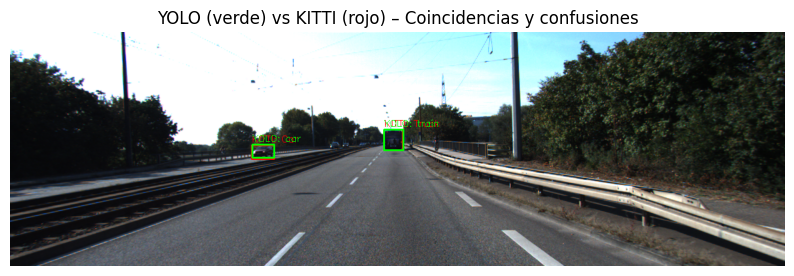

In [11]:

import matplotlib.pyplot as plt
from ultralytics import YOLO

# --- Función para calcular IoU ---
def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = inter_area / float(boxA_area + boxB_area - inter_area + 1e-6)
    return iou

# --- Configuración ---
image_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/images_od/000001.png'
label_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/labels_od_2D/000001.txt'
iou_threshold = 0.5

# Clase relevante y su mapeo
class_mapping = {
    'Car': 'car',
    'Tram': 'train',
    'Person_sitting': 'person',
    'Pedestrian': 'person',
    'Truck': 'truck'
}
relevant_yolo_classes = ['car', 'person', 'truck', 'train']

# Cargar modelo e imagen
model = YOLO('yolov8l.pt')
img = cv2.imread(image_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_copy = img.copy()

# --- Leer anotaciones KITTI (todas las clases) ---
kitti_boxes = []
kitti_boxes_all = []  # incluye incluso irrelevantes

with open(label_path, 'r') as f:
    for line in f:
        parts = line.strip().split()
        cls = parts[0]
        box = list(map(int, map(float, parts[4:8])))
        kitti_boxes_all.append((cls, box))

        if cls not in class_mapping:
            continue
        mapped_class = class_mapping[cls]
        if mapped_class not in relevant_yolo_classes:
            continue
        kitti_boxes.append((mapped_class, box))
        cv2.rectangle(img_copy, (box[0], box[1]), (box[2], box[3]), (0, 0, 255), 2)
        cv2.putText(img_copy, f"KITTI: {cls}", (box[0], box[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

# --- Detecciones YOLO relevantes ---
results = model.predict(img_rgb, verbose=False)[0]
yolo_boxes = []

for box in results.boxes:
    cls = model.names[int(box.cls)]
    if cls not in relevant_yolo_classes:
        continue
    coords = list(map(int, box.xyxy[0]))
    yolo_boxes.append((cls, coords))
    cv2.rectangle(img_copy, (coords[0], coords[1]), (coords[2], coords[3]), (0, 255, 0), 2)
    cv2.putText(img_copy, f"YOLO: {cls}", (coords[0], coords[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

# --- Comparar ---
matches = []
false_positives = []
confusions = []
used_kitti = set()

for y_cls, y_box in yolo_boxes:
    match_found = False
    for i, (k_cls, k_box) in enumerate(kitti_boxes):
        if i in used_kitti:
            continue
        if y_cls == k_cls and compute_iou(y_box, k_box) > iou_threshold:
            matches.append((y_cls, y_box, k_box))
            used_kitti.add(i)
            match_found = True
            break
    if not match_found:
        false_positives.append((y_cls, y_box))

# --- Detectar confusiones ---
for fp_cls, fp_box in false_positives:
    for k_cls_raw, k_box in kitti_boxes_all:
        mapped_k_cls = class_mapping.get(k_cls_raw, None)
        if compute_iou(fp_box, k_box) > iou_threshold:
            if mapped_k_cls and mapped_k_cls != fp_cls:
                confusions.append((fp_cls, mapped_k_cls))
            break

# --- Falsos negativos ---
false_negatives = [k for i, k in enumerate(kitti_boxes) if i not in used_kitti]

# --- Mostrar resumen ---
print(f"\n✅ Coincidencias correctas: {len(matches)}")
print(f"❌ Falsos positivos (YOLO detectó y no estaba en KITTI): {len(false_positives)}")
print(f"❌ Falsos negativos (KITTI tenía y YOLO no detectó): {len(false_negatives)}")

if confusions:
    print("\n🔁 Confusiones detectadas (YOLO detectó mal la clase):")
    for detected, real in confusions:
        print(f"   YOLO: '{detected}'  →  En realidad era: '{real}'")
else:
    print("\n✅ No se detectaron confusiones de clase.")

# --- Mostrar imagen anotada ---
plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("YOLO (verde) vs KITTI (rojo) – Coincidencias y confusiones")
plt.show()


Con este codigo se mitiga el problema del anterior apartado ya que al aplicar el IoU se comprueban 2 cosas: que la clase sea la correcta, que el IoU sea mayor que 0,5 en cada caso. Con esto se consigue que aunque algo no este anotado en el vocabulario, se vea que se ha reconocido algo y se pueda detectar el error.

**Ahora que ya hemos conseguido detectar cuando YOLO detecta objetos correctamente y cuando se equivoca vamos a probar a ejecutar esto mismo en 5 imágenes en lugar de solo en una, además, añadiremos estadísticas para poder ver que clases le cuesta más detectar a YOLO o cuales asigna a objetos equivocados con más facilidad**

In [12]:
def compute_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    iou = inter_area / float(boxA_area + boxB_area - inter_area + 1e-6)
    return iou

# --- Configuración ---
images_dir = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/images_od'
labels_dir = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/labels_od_2D'
model = YOLO('yolov8l.pt')
iou_threshold = 0.5

# Clases relevantes y su mapeo
class_mapping = {
    'Car': 'car',
    'Tram': 'train',
    'Person_sitting': 'person',
    'Pedestrian': 'person',
    'Truck': 'truck'
}
relevant_yolo_classes = ['car', 'person', 'truck', 'train']

# Contadores por clase
stats = {cls: {'TP': 0, 'FN': 0, 'FP': 0, 'Total_GT': 0} for cls in relevant_yolo_classes}

# Procesar las 5 primeras imágenes
for i in range(5):
    image_id = f"{i:06d}"
    image_path = os.path.join(images_dir, image_id + ".png")
    label_path = os.path.join(labels_dir, image_id + ".txt")

    # Cargar imagen y detecciones YOLO
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model.predict(img_rgb, verbose=False)[0]

    # --- Leer anotaciones KITTI (todas las clases) ---
    kitti_boxes_all = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            cls = parts[0]
            box = list(map(int, map(float, parts[4:8])))
            kitti_boxes_all.append((cls, box))

    # Filtrar anotaciones relevantes
    kitti_boxes = []
    for cls_raw, box in kitti_boxes_all:
        if cls_raw in class_mapping:
            mapped_cls = class_mapping[cls_raw]
            if mapped_cls in relevant_yolo_classes:
                kitti_boxes.append((mapped_cls, box))
                stats[mapped_cls]['Total_GT'] += 1

    # Filtrar detecciones YOLO relevantes
    yolo_boxes = []
    for box in results.boxes:
        cls = model.names[int(box.cls)]
        if cls in relevant_yolo_classes:
            coords = list(map(int, box.xyxy[0]))
            yolo_boxes.append((cls, coords))

    # --- Matching ---
    used_kitti = set()
    matched_yolo = set()

    for y_idx, (y_cls, y_box) in enumerate(yolo_boxes):
        match_found = False
        for k_idx, (k_cls, k_box) in enumerate(kitti_boxes):
            if k_idx in used_kitti:
                continue
            if y_cls == k_cls and compute_iou(y_box, k_box) > iou_threshold:
                stats[y_cls]['TP'] += 1
                used_kitti.add(k_idx)
                matched_yolo.add(y_idx)
                match_found = True
                break
        if not match_found:
            stats[y_cls]['FP'] += 1

    # Falsos negativos
    for k_idx, (k_cls, _) in enumerate(kitti_boxes):
        if k_idx not in used_kitti:
            stats[k_cls]['FN'] += 1

# --- Mostrar resumen final ---
for cls in relevant_yolo_classes:
    print(f"\nClase: {cls}")
    print(f"  Total anotaciones en KITTI (GT): {stats[cls]['Total_GT']}")
    print(f"  Verdaderos Positivos (TP):       {stats[cls]['TP']}")
    print(f"  Falsos Negativos (FN):           {stats[cls]['FN']}")
    print(f"  Falsos Positivos (FP):           {stats[cls]['FP']}")


Clase: car
  Total anotaciones en KITTI (GT): 5
  Verdaderos Positivos (TP):       5
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           2

Clase: person
  Total anotaciones en KITTI (GT): 1
  Verdaderos Positivos (TP):       1
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           0

Clase: truck
  Total anotaciones en KITTI (GT): 1
  Verdaderos Positivos (TP):       0
  Falsos Negativos (FN):           1
  Falsos Positivos (FP):           2

Clase: train
  Total anotaciones en KITTI (GT): 0
  Verdaderos Positivos (TP):       0
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           1


Donde los verdaderos positivos son que Yolo detecto correctamente, falso negativo no detectó algo que debia, falso positivo detecto algo que no debia.

El codigo recorre las detecciones de Yolo y sicoincide la clase y el Iou es verdaadero positivo, si no encuentra match falso positivo y si hay alguna anotacion en kiti que no es detectada falso negativo.

**Añadamos ahora con que objetos (de los detectados por KITTI) suele confundirse cuando detecta falsos positivos, también anotaremos cuando detecte un objeto en un lugar en el que KITTI no tiene nada anotado**

In [13]:
import os
import cv2
from ultralytics import YOLO
from collections import defaultdict, Counter
from shapely.geometry import box as shapely_box

# --- Configuración ---
dataset_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/'
image_paths = sorted(glob.glob(os.path.join(dataset_path, 'images_od', '*.png')))[:5]
label_paths = sorted(glob.glob(os.path.join(dataset_path, 'labels_od_2D', '*.txt')))[:5]

model = YOLO('yolov8l.pt')

# Mapping KITTI → YOLO clases relevantes
class_mapping = {
    'Car': 'car',
    'Tram' : 'train',
    'Person_sitting' : 'person',
    'Pedestrian': 'person',
    'Truck': 'truck'
}

relevant_yolo_classes = ['car', 'person', 'truck', 'train']

# Inicializar contadores
stats = {cls: {'GT': 0, 'TP': 0, 'FN': 0, 'FP': 0} for cls in relevant_yolo_classes}
confusions = defaultdict(Counter)

def iou(boxA, boxB):
    boxA = shapely_box(*boxA)
    boxB = shapely_box(*boxB)
    inter = boxA.intersection(boxB).area
    union = boxA.union(boxB).area
    return inter / union if union > 0 else 0

# --- Evaluación de cada imagen ---
for img_path, label_path in zip(image_paths, label_paths):
    # Leer imagen y anotaciones
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model.predict(img_rgb, verbose=False)[0]

    # Anotaciones GT (KITTI)
    kitti_objects = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_kitti = parts[0]
            if class_kitti == 'DontCare':
                continue
            x1, y1, x2, y2 = map(float, parts[4:8])
            mapped_class = class_mapping.get(class_kitti, None)
            kitti_objects.append({'class_kitti': class_kitti, 'mapped': mapped_class, 'bbox': (x1, y1, x2, y2), 'used': False})

    # Detecciones YOLO relevantes
    for box in results.boxes:
        yolo_cls = model.names[int(box.cls)]
        if yolo_cls not in relevant_yolo_classes:
            continue
        x1, y1, x2, y2 = map(float, box.xyxy[0])
        bbox_pred = (x1, y1, x2, y2)

        matched = False
        for obj in kitti_objects:
            if obj['mapped'] == yolo_cls and not obj['used']:
                if iou(bbox_pred, obj['bbox']) > 0.5:
                    stats[yolo_cls]['TP'] += 1
                    obj['used'] = True
                    matched = True
                    break

        if not matched:
            stats[yolo_cls]['FP'] += 1
            # Buscar posible clase real de la región
            best_match = None
            best_iou = 0
            for obj in kitti_objects:
                iou_score = iou(bbox_pred, obj['bbox'])
                if iou_score > best_iou:
                    best_iou = iou_score
                    best_match = obj
            if best_iou > 0.3:
                confusions[yolo_cls][best_match['class_kitti']] += 1
            else:
                confusions[yolo_cls]['no_object'] += 1

    # Contar anotaciones GT
    for obj in kitti_objects:
        if obj['mapped'] in relevant_yolo_classes:
            stats[obj['mapped']]['GT'] += 1
            if not obj['used']:
                stats[obj['mapped']]['FN'] += 1

# --- Mostrar resumen ---
for cls in relevant_yolo_classes:
    print(f"Clase: {cls}")
    print(f"  Total anotaciones en KITTI (GT): {stats[cls]['GT']}")
    print(f"  Verdaderos Positivos (TP):       {stats[cls]['TP']}")
    print(f"  Falsos Negativos (FN):           {stats[cls]['FN']}")
    print(f"  Falsos Positivos (FP):           {stats[cls]['FP']}")
    if cls in confusions:
        print(f"Clase detectada por YOLO: '{cls}'")
        for wrong_cls, count in confusions[cls].items():
            print(f"  → Se confundió con: '{wrong_cls}' → {count} veces")
    print()

Clase: car
  Total anotaciones en KITTI (GT): 5
  Verdaderos Positivos (TP):       5
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           2
Clase detectada por YOLO: 'car'
  → Se confundió con: 'no_object' → 2 veces

Clase: person
  Total anotaciones en KITTI (GT): 1
  Verdaderos Positivos (TP):       1
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           0

Clase: truck
  Total anotaciones en KITTI (GT): 1
  Verdaderos Positivos (TP):       0
  Falsos Negativos (FN):           1
  Falsos Positivos (FP):           2
Clase detectada por YOLO: 'truck'
  → Se confundió con: 'Misc' → 1 veces
  → Se confundió con: 'Car' → 1 veces

Clase: train
  Total anotaciones en KITTI (GT): 0
  Verdaderos Positivos (TP):       0
  Falsos Negativos (FN):           0
  Falsos Positivos (FP):           1
Clase detectada por YOLO: 'train'
  → Se confundió con: 'Truck' → 1 veces



Aqui se usa la libreria shapely que es mas robusta que un codigo hecho a mano ya que esta optimizado

**Ahora lo aplicaremos a todas las imágenes y añadiremos la precisión media**

In [14]:
import os
import glob
import cv2
from ultralytics import YOLO
from collections import defaultdict, Counter
from shapely.geometry import box as shapely_box

# --- Configuración ---
dataset_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/'
image_paths = sorted(glob.glob(os.path.join(dataset_path, 'images_od', '*.png')))
label_paths = sorted(glob.glob(os.path.join(dataset_path, 'labels_od_2D', '*.txt')))

model = YOLO('yolov8l.pt')

# Mapping KITTI → YOLO clases relevantes
class_mapping = {
    'Car': 'car',
    'Tram': 'train',
    'Person_sitting': 'person',
    'Pedestrian': 'person',
    'Truck': 'truck'
}

relevant_yolo_classes = ['car', 'person', 'truck', 'train']

# Inicializar contadores
stats = {cls: {'GT': 0, 'TP': 0, 'FN': 0, 'FP': 0} for cls in relevant_yolo_classes}
confusions = defaultdict(Counter)

def iou(boxA, boxB):
    boxA = shapely_box(*boxA)
    boxB = shapely_box(*boxB)
    inter = boxA.intersection(boxB).area
    union = boxA.union(boxB).area
    return inter / union if union > 0 else 0

# --- Evaluación de cada imagen ---
for img_path, label_path in zip(image_paths, label_paths):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = model.predict(img_rgb, verbose=False)[0]

    # Leer anotaciones GT (formato KITTI)
    kitti_objects = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_kitti = parts[0]
            if class_kitti == 'DontCare':
                continue
            x1, y1, x2, y2 = map(float, parts[4:8])
            mapped_class = class_mapping.get(class_kitti, None)
            kitti_objects.append({'class_kitti': class_kitti, 'mapped': mapped_class, 'bbox': (x1, y1, x2, y2), 'used': False})

    # Detecciones YOLO relevantes
    for box in results.boxes:
        yolo_cls = model.names[int(box.cls)]
        if yolo_cls not in relevant_yolo_classes:
            continue
        x1, y1, x2, y2 = map(float, box.xyxy[0])
        bbox_pred = (x1, y1, x2, y2)

        matched = False
        for obj in kitti_objects:
            if obj['mapped'] == yolo_cls and not obj['used']:
                if iou(bbox_pred, obj['bbox']) > 0.5:
                    stats[yolo_cls]['TP'] += 1
                    obj['used'] = True
                    matched = True
                    break

        if not matched:
            stats[yolo_cls]['FP'] += 1
            best_match = None
            best_iou = 0
            for obj in kitti_objects:
                iou_score = iou(bbox_pred, obj['bbox'])
                if iou_score > best_iou:
                    best_iou = iou_score
                    best_match = obj
            if best_iou > 0.3:
                mapped = best_match['mapped']
                if mapped != yolo_cls:
                    confusions[yolo_cls][best_match['class_kitti']] += 1
            else:
                confusions[yolo_cls]['no_object'] += 1

    # Contar GT por clase
    for obj in kitti_objects:
        if obj['mapped'] in relevant_yolo_classes:
            stats[obj['mapped']]['GT'] += 1
            if not obj['used']:
                stats[obj['mapped']]['FN'] += 1

# --- Cálculo de AP y mAP ---
APs = []

print("\n=== Resultados por clase ===\n")
for cls in relevant_yolo_classes:
    TP = stats[cls]['TP']
    FP = stats[cls]['FP']
    FN = stats[cls]['FN']
    GT = stats[cls]['GT']

    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    AP = precision * recall  # Aproximación: AP = P × R
    APs.append(AP)

    print(f"Clase: {cls}")
    print(f"  Total anotaciones en KITTI (GT): {GT}")
    print(f"  Verdaderos Positivos (TP):       {TP}")
    print(f"  Falsos Negativos (FN):           {FN}")
    print(f"  Falsos Positivos (FP):           {FP}")
    print(f"  Precisión:                       {precision:.4f}")
    print(f"  Recall:                          {recall:.4f}")
    print(f"  AP (aproximado):                 {AP:.4f}")
    if cls in confusions:
        print(f"  Confusiones detectadas como '{cls}':")
        for wrong_cls, count in confusions[cls].items():
            print(f"    → Confundido con: '{wrong_cls}' → {count} veces")
    print()

# --- Resultado global ---
mean_ap = sum(APs) / len(APs)
print(f"=== mAP global (aproximado): {mean_ap:.4f} ===")



=== Resultados por clase ===

Clase: car
  Total anotaciones en KITTI (GT): 733
  Verdaderos Positivos (TP):       566
  Falsos Negativos (FN):           167
  Falsos Positivos (FP):           291
  Precisión:                       0.6604
  Recall:                          0.7722
  AP (aproximado):                 0.5100
  Confusiones detectadas como 'car':
    → Confundido con: 'no_object' → 206 veces
    → Confundido con: 'Van' → 18 veces
    → Confundido con: 'Misc' → 3 veces

Clase: person
  Total anotaciones en KITTI (GT): 115
  Verdaderos Positivos (TP):       70
  Falsos Negativos (FN):           45
  Falsos Positivos (FP):           84
  Precisión:                       0.4545
  Recall:                          0.6087
  AP (aproximado):                 0.2767
  Confusiones detectadas como 'person':
    → Confundido con: 'no_object' → 48 veces
    → Confundido con: 'Cyclist' → 30 veces
    → Confundido con: 'Misc' → 1 veces

Clase: truck
  Total anotaciones en KITTI (GT): 24
  

In [15]:
print("\n=== Resumen Final de AP por Clase ===")
for cls, ap in zip(relevant_yolo_classes, APs):
    print(f"AP clase '{cls}': {ap:.4f}")


=== Resumen Final de AP por Clase ===
AP clase 'car': 0.5100
AP clase 'person': 0.2767
AP clase 'truck': 0.1051
AP clase 'train': 0.1420


**La suma de las confusiones que imprimimos por pantalla y el número de falsos positivos, esto se debe a que había casos en los que la bounding box de la detección de YOLO y la de la anotación de KITTI no coincidían lo suficiente para considerarse un acierto, sin embargo cuando analizábamos con que objeto se estaba confundiendo (al coincidir considerablemente con la bounding box de la anotación, aunque no lo suficiente para considerarse un acierto) se consideraba que se estaba confundiendo con el mismo objeto que se había detectado.**

**En resumen, que los falsos positivos sin clasificar son aquellos que no está del todo claro si eran errores o solo detecciones mediocres.**

**Al observar los resultados estas son las conclusiones que sacamos:**

**car: Claramente el objeto más común, parece que lo detecta con bastante facilidad. Podemos observar un gran número de falsos positivos, pero en la inmensa mayoría de las veces no hay un objeto específico con el que se esté confundiendo, lo que probablemente se deba a que YOLO detecta coches en una imagen que KITTI no ha incluido en sus anotaciones.**

**person: En este caso la mayoría de falsos positivos son por estas dos razones: o casos de no object, que pueden ser por el mismo motivo que mencionamos antes con los coches o cyclists, este es un caso en el que no creo que debamos considerar que es un error ya que YOLO lo que hizo fue detectar a la persona que iba montada en la bici mientras que KITTI reconoce la bici y la persona como un único objeto, esto es algo que ya suponíamos que podía ocurrir, no quisimos hacer match entre estas clases porque las bounding boxes probablemente quedarían demasiado distintas.**

**truck: Esta clase podemos ver que le cuesta bastante detectarla, probablemente sea porque le faltan clases como van (que KITTI si posee) para conseguir que YOLO sea más crítico respecto a que cosas pueden entrar en esta categoría, se confunde mucho con coches y furgonetas y en bastantes casos no detecta a los camiones que si están en la imagen.**

**train: En este caso el problema está muy claro y es que los trenes que hay en la imagen YOLO no los clasifica como tales, es junto con truck la clase que peor detecta YOLO.**

# ESTIMACIÓN DE LA DISTANCIA

**Empezamos probando a obtener los puntos LIDAR de las imágenes, ya que son lo que utilizaremos para medir la profundidad de los objetos que detectemos con YOLO**

In [16]:


# Funciones utilitarias
def read_kitti_calib(filepath):
    data = {}
    with open(filepath, 'r') as f:
        for line in f.readlines():
            if ':' in line:
                key, value = line.strip().split(':', 1)
                try:
                    data[key] = np.array([float(x) for x in value.strip().split()])
                except ValueError:
                    continue
    return data

def load_from_bin(bin_path):
    return np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)

def project_lidar_to_image(points, calib):
    Tr = calib['Tr'].reshape(3, 4)
    Tr = np.vstack((Tr, [0, 0, 0, 1]))
    R0 = calib['R0']
    P = calib['P2'].reshape(3, 4)

    pts_hom = np.hstack((points[:, :3], np.ones((points.shape[0], 1)))).T
    pts_cam = R0 @ Tr @ pts_hom
    pts_cam = pts_cam[:3, :]

    pts_2d = P @ np.vstack((pts_cam, np.ones((pts_cam.shape[1]))))
    pts_2d = pts_2d[:2] / pts_2d[2]

    return pts_2d.T, pts_cam.T


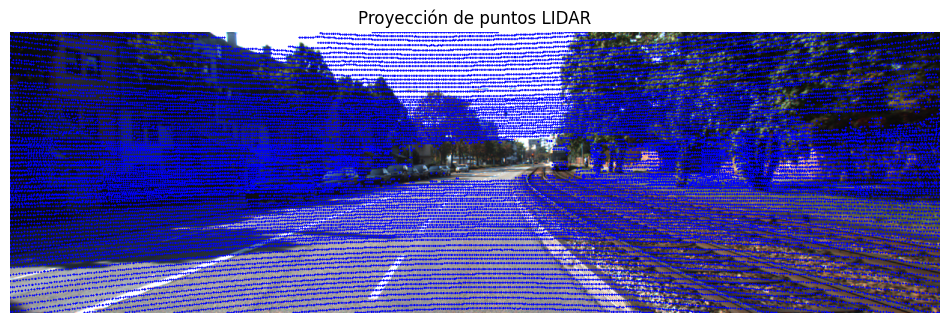

In [17]:
import numpy as np

# Ruta base y calibración
base_ruta = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/car_routes'
secuencia = sorted([d for d in os.listdir(base_ruta) if os.path.isdir(os.path.join(base_ruta, d))])[0]

calib_cam_path = os.path.join(base_ruta, 'calib_cam_to_cam.txt')
calib_velo_path = os.path.join(base_ruta, 'calib_velo_to_cam.txt')
calib_cam = read_kitti_calib(calib_cam_path)
calib_velo = read_kitti_calib(calib_velo_path)

R = calib_velo['R'].reshape(3, 3)
T = calib_velo['T'].reshape(3, 1)
Tr = np.hstack((R, T))
P2 = calib_cam['P_rect_02']
R0_rect = calib_cam['R_rect_00'].reshape(3, 3)

calib = {
    'P2': P2,
    'Tr': Tr,
    'R0': np.eye(4)
}
calib['R0'][:3, :3] = R0_rect

# Cargar imagen y LIDAR
ruta = os.path.join(base_ruta, secuencia)
img_path = sorted(glob.glob(os.path.join(ruta, 'image_02/data/*.png')))[0]
lidar_path = sorted(glob.glob(os.path.join(ruta, 'velodyne_points/data/*.bin')))[0]

image = cv2.imread(img_path)
lidar = load_from_bin(lidar_path)
proj_pts, pts_cam = project_lidar_to_image(lidar, calib)

# Dibujar puntos
img_draw = image.copy()
for x, y in proj_pts:
    x, y = int(x), int(y)
    if 0 <= x < image.shape[1] and 0 <= y < image.shape[0]:
        cv2.circle(img_draw, (x, y), 1, (255, 0, 0), -1)

plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Proyección de puntos LIDAR")
plt.show()


**Ahora veremos si conseguimos que se combinen correctamente los puntos LIDAR y las bounding boxes de YOLO para estimar la distancia de los objetos detectados**

In [18]:


# Cargar modelo YOLO
model = YOLO('yolov8n.pt')

def procesar_imagen(image, proj_pts, pts_cam):
    try:
        # Sincronizar longitudes para evitar errores
        min_len = min(len(proj_pts), len(pts_cam))
        proj_pts = proj_pts[:min_len]
        pts_cam = pts_cam[:min_len]

        result = model.predict(image, verbose=False)[0]
        img_draw = image.copy()

        # Dibujar puntos
        for x, y in proj_pts:
            x, y = int(x), int(y)
            if 0 <= x < image.shape[1] and 0 <= y < image.shape[0]:
                cv2.circle(img_draw, (x, y), 1, (255, 0, 0), -1)

        # Dibujar cajas y etiquetas
        for box in result.boxes:
            cls = model.names[int(box.cls)]
            conf = float(box.conf)
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 255, 0), 2)

            mask = (proj_pts[:, 0] >= x1) & (proj_pts[:, 0] <= x2) & \
                   (proj_pts[:, 1] >= y1) & (proj_pts[:, 1] <= y2)

            selected_points = pts_cam[mask]

            if len(selected_points) > 0:
                dists = np.linalg.norm(selected_points, axis=1)
                dist = np.percentile(dists, 10)
                label = f"{cls} ({conf:.2f}) - {dist:.1f}m"
            else:
                label = f"{cls} ({conf:.2f}) - ❌"

            text_y = max(y1 - 5, 10)  # evitar dibujar fuera de imagen
            cv2.putText(img_draw, label, (x1, text_y),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

        return cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

    except Exception as e:
        print("⚠️ Error al procesar imagen:", e)
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


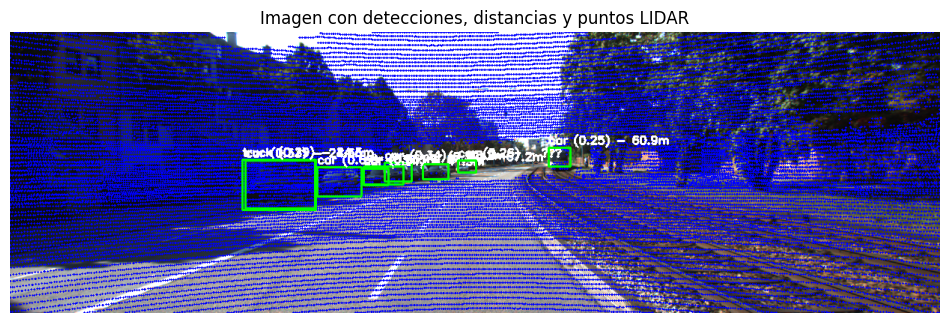

In [19]:
imagen_completa = procesar_imagen(image, proj_pts, pts_cam)

plt.figure(figsize=(12, 6))
plt.imshow(imagen_completa)
plt.axis('off')
plt.title("Imagen con detecciones, distancias y puntos LIDAR")
plt.show()


In [20]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Volver a listar secuencias disponibles
secuencias = sorted([d for d in os.listdir(base_ruta) if os.path.isdir(os.path.join(base_ruta, d))])

# Función para cargar imágenes de una secuencia dada
def cargar_secuencia(secuencia):
    ruta = os.path.join(base_ruta, secuencia)
    image_files = sorted(glob.glob(os.path.join(ruta, 'image_02/data/*.png')))
    lidar_files = sorted(glob.glob(os.path.join(ruta, 'velodyne_points/data/*.bin')))
    imagenes = []

    for i in range(len(image_files)):
        img = cv2.imread(image_files[i])
        lidar = load_from_bin(lidar_files[i])
        proj_pts, pts_cam = project_lidar_to_image(lidar, calib)

        min_len = min(len(proj_pts), len(pts_cam))
        proj_pts = proj_pts[:min_len]
        pts_cam = pts_cam[:min_len]

        img_proc = procesar_imagen(img, proj_pts, pts_cam)
        imagenes.append(img_proc)
    return imagenes

# Interfaz de selección de secuencia
def mostrar_selector():
    secuencia_dropdown = widgets.Dropdown(
        options=secuencias,
        description='Secuencia:',
        value=secuencias[0]
    )

    output = widgets.Output()

    def on_change(change):
        with output:
            clear_output(wait=True)
            secuencia = change['new']
            imagenes = cargar_secuencia(secuencia)

            def mostrar_frame(i):
                plt.figure(figsize=(12, 6))
                plt.imshow(imagenes[i])
                plt.title(f"{secuencia} - Frame {i}")
                plt.axis("off")
                plt.show()

            slider = widgets.IntSlider(value=0, min=0, max=len(imagenes)-1, step=1, description='Frame')
            display(widgets.interact(mostrar_frame, i=slider))

    secuencia_dropdown.observe(on_change, names='value')

    display(secuencia_dropdown, output)
    # Mostrar por defecto
    on_change({'new': secuencia_dropdown.value})

mostrar_selector()


Dropdown(description='Secuencia:', options=('2011_09_26_drive_0001_sync', '2011_09_26_drive_0013_sync', '2011_…

Output()

#ESTIMACIÓN DE LA POSICIÓN


In [21]:
# Para acelerar la carga de imágenes las copiamos a google colab de manera interna
!cp -r /content/drive/MyDrive/APSE/4.2.2_kitti_dataset/kitti_data/car_routes/2011_09_26_drive_0113_sync/image_02/data /content


 Procesando: 2011_09_26_drive_0001_sync


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


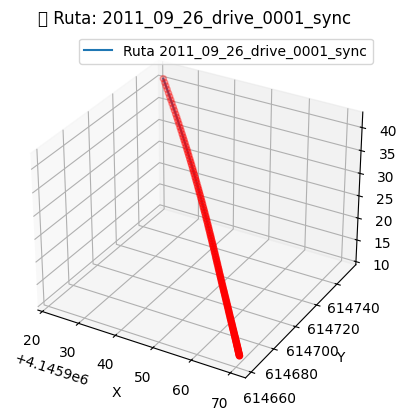

✅ Video generado: 2011_09_26_drive_0001_sync_video_1748972490.avi



 Procesando: 2011_09_26_drive_0013_sync


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


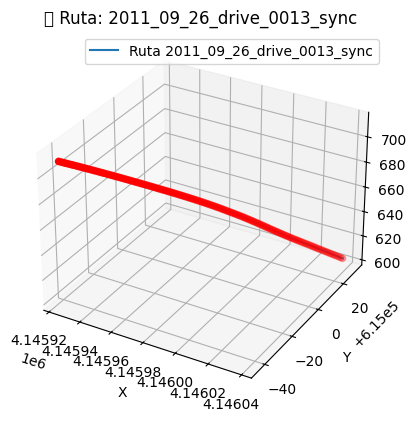

✅ Video generado: 2011_09_26_drive_0013_sync_video_1748972506.avi



 Procesando: 2011_09_26_drive_0113_sync


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


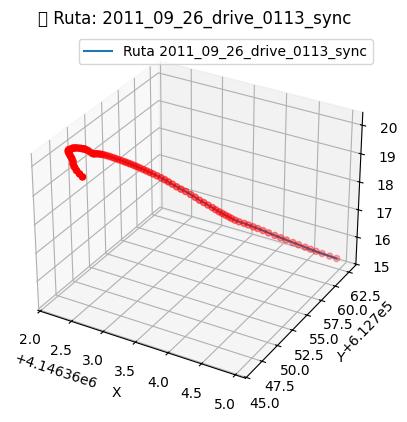

✅ Video generado: 2011_09_26_drive_0113_sync_video_1748972523.avi


In [22]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2
import time
import imageio
from IPython.display import HTML
import utils.kitti_util as utils

# Constantes
dataset_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/'
routes = [
    '2011_09_26_drive_0001_sync',
    '2011_09_26_drive_0013_sync',
    '2011_09_26_drive_0113_sync'
]

def geodetic_to_ecef(lat, lon, alt):
    a = 6378137
    b = 6356752.3142
    e_sq = 1 - (b**2 / a**2)
    lat_rad = np.radians(lat)
    lon_rad = np.radians(lon)
    N = a / np.sqrt(1 - e_sq * np.sin(lat_rad)**2)
    X = (N + alt) * np.cos(lat_rad) * np.cos(lon_rad)
    Y = (N + alt) * np.cos(lat_rad) * np.sin(lon_rad)
    Z = ((b**2 / a**2) * N + alt) * np.sin(lat_rad)
    return X, Y, Z

# Procesar cada ruta
for route in routes:
    print(f"\n Procesando: {route}")

    # Copiar imágenes a /content para acelerar el acceso
    local_img_folder = f"/content/{route}_data"
    src_img_folder = os.path.join(dataset_path, f"kitti_data/car_routes/{route}/image_02/data")
    !cp -r "{src_img_folder}" "{local_img_folder}"

    # Leer datos GPS (lat, lon, alt)
    oxts_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/data')
    gps_files = sorted(glob.glob(oxts_path + '/*.txt'))

    latitude, longitude, altitude = [], [], []
    for f in gps_files:
        with open(f, 'r') as file:
            values = file.read().split(" ")
            latitude.append(float(values[0]))
            longitude.append(float(values[1]))
            altitude.append(float(values[2]))

    # Convertir a coordenadas ECEF
    x, y, z = zip(*[geodetic_to_ecef(lat, lon, alt) for lat, lon, alt in zip(latitude, longitude, altitude)])

    # Plot ruta 3D
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(x, y, z, label=f'Ruta {route}')
    ax.scatter(x, y, z, color='r')
    ax.set_title(f'📍 Ruta: {route}')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend()
    plt.show()

    # Crear video con las imágenes
    images_path = sorted(glob.glob(f'{local_img_folder}/*.png'))
    fps = 10
    video_name = f'{route}_video_{int(time.time())}.avi'
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(video_name, fourcc, fps, (1242, 375))

    for img_path in images_path:
        frame = cv2.imread(img_path)
        if frame is not None:
            video_writer.write(frame)
        else:
            print("⚠️ Error al cargar la imagen:", img_path)
    video_writer.release()

    # Mostrar video si se generó correctamente
    print(f"✅ Video generado: {video_name}")
    vid = imageio.mimread(video_name)
    display(HTML(utils.display_video(vid).to_html5_video()))

Se usan las 3 rutas para este apartado, vemos que en los plots de las posición según los timestamps se corresponden los plots a sus correspondientes videos (juntando todas las imagenes)

📍 Procesando ruta: 2011_09_26_drive_0001_sync


<ipython-input-23-e012a3083e3c>:67: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


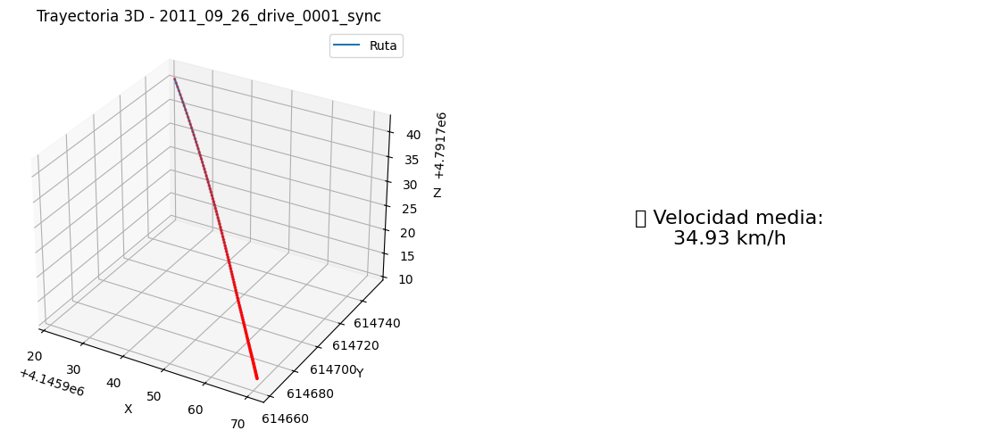

📍 Procesando ruta: 2011_09_26_drive_0013_sync


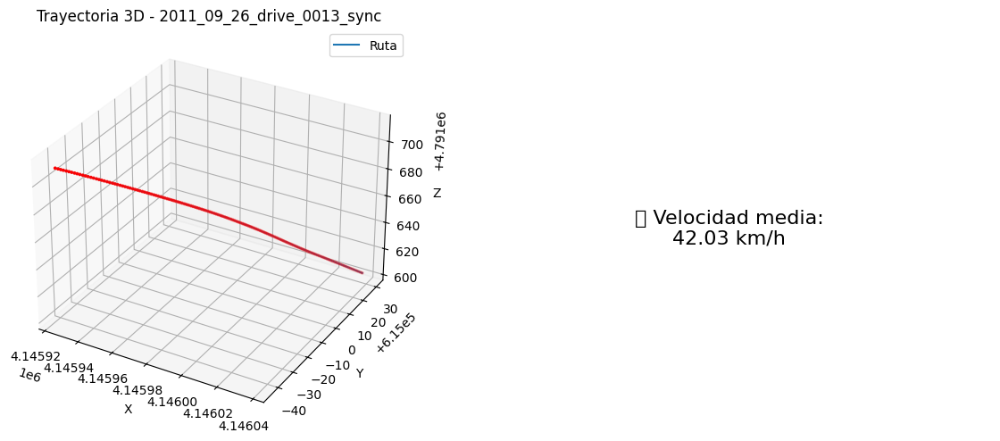

📍 Procesando ruta: 2011_09_26_drive_0113_sync


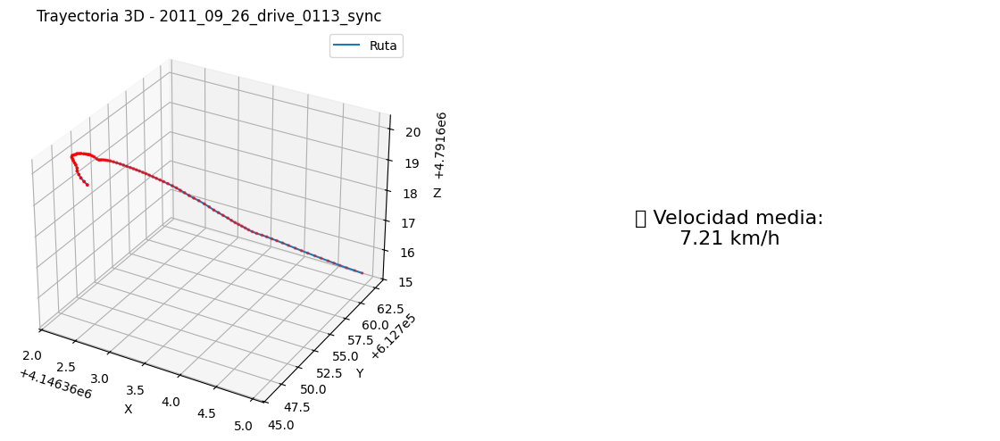

In [23]:
from datetime import datetime
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def geodetic_to_ecef(lat, lon, alt):
    a = 6378137
    b = 6356752.3142
    e_sq = 1 - (b**2 / a**2)

    lat_rad = np.radians(lat)
    lon_rad = np.radians(lon)
    N = a / np.sqrt(1 - e_sq * np.sin(lat_rad)**2)

    X = (N + alt) * np.cos(lat_rad) * np.cos(lon_rad)
    Y = (N + alt) * np.cos(lat_rad) * np.sin(lon_rad)
    Z = ((b**2 / a**2) * N + alt) * np.sin(lat_rad)

    return X, Y, Z

# Procesar cada ruta
for route in ['2011_09_26_drive_0001_sync', '2011_09_26_drive_0013_sync', '2011_09_26_drive_0113_sync']:
    print(f"📍 Procesando ruta: {route}")
    gps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/data')
    gps_files = sorted(glob.glob(os.path.join(gps_path, '*.txt')))

    latitude = []
    longitude = []
    altitude = []

    for f in gps_files:
        with open(f, 'r') as file:
            vals = file.read().split()
            latitude.append(float(vals[0]))
            longitude.append(float(vals[1]))
            altitude.append(float(vals[2]))

    x, y, z = zip(*[geodetic_to_ecef(lat, lon, alt) for lat, lon, alt in zip(latitude, longitude, altitude)])

    timestamps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/timestamps.txt')
    with open(timestamps_path, 'r') as f:
        timestamps = [datetime.fromisoformat(line.strip()) for line in f]

    assert len(timestamps) == len(x), "❌ Mismatch entre coordenadas y timestamps."

    distancias = [np.linalg.norm(np.array([x[i+1], y[i+1], z[i+1]]) - np.array([x[i], y[i], z[i]]))
                  for i in range(len(x)-1)]
    tiempo_total = (timestamps[-1] - timestamps[0]).total_seconds()
    distancia_total = sum(distancias)
    velocidad_media = (distancia_total / tiempo_total) * 3.6 if tiempo_total > 0 else 0

    # Plot 3D
    fig = plt.figure(figsize=(12, 5))
    ax = fig.add_subplot(121, projection='3d')
    ax.plot(x, y, z, label='Ruta')
    ax.scatter(x, y, z, color='r', s=3)
    ax.set_title(f'Trayectoria 3D - {route}')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.legend()

    # Mostrar velocidad
    ax2 = fig.add_subplot(122)
    ax2.axis('off')
    ax2.text(0.5, 0.5, f"🚗 Velocidad media:\n{velocidad_media:.2f} km/h",
             fontsize=16, ha='center', va='center')
    plt.tight_layout()
    plt.show()


Vemos las velocidades medias de cada ruta, tambien parece que se corresponden las velocidades con sus rutas, en los 2 primeros al ser en una carretera a mas velocidad, la velocidad media es mayor, y sin embargo el otro coche que parece que esta entrando a una propiedad va mas despacion para prevenir un accidente.

In [24]:
def velocidad_por_tramos_temporales(timestamps, x, y, z, intervalo=1):
    velocidades = []
    tiempos = []
    inicio = 0

    for i in range(1, len(timestamps)):
        dt = (timestamps[i] - timestamps[inicio]).total_seconds()
        if dt >= intervalo:
            dx = x[i] - x[inicio]
            dy = y[i] - y[inicio]
            dz = z[i] - z[inicio]
            distancia = np.linalg.norm([dx, dy, dz])  # metros
            velocidad = (distancia / dt) * 3.6  # km/h
            velocidades.append(velocidad)
            tiempos.append(timestamps[i])
            inicio = i  # nuevo inicio del siguiente tramo

    return tiempos, velocidades



📊 Análisis de velocidad por tramos - 2011_09_26_drive_0001_sync


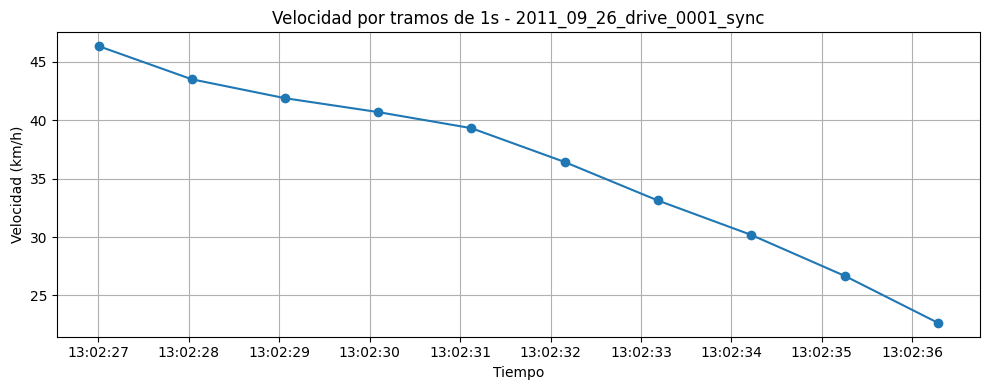


📊 Análisis de velocidad por tramos - 2011_09_26_drive_0013_sync


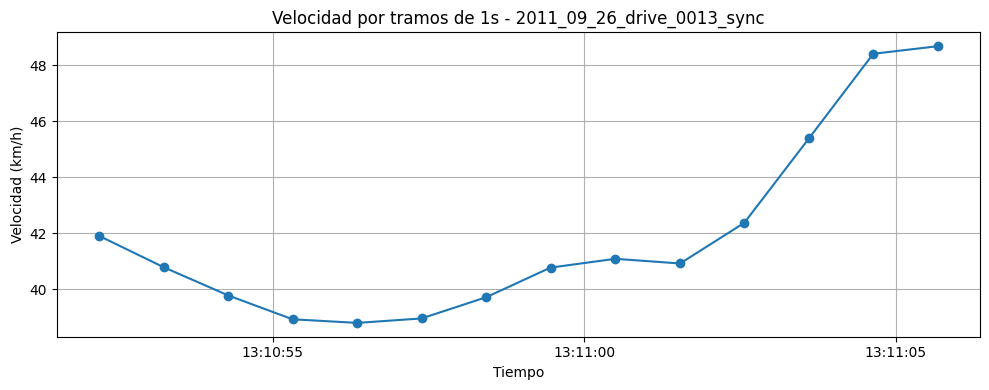


📊 Análisis de velocidad por tramos - 2011_09_26_drive_0113_sync


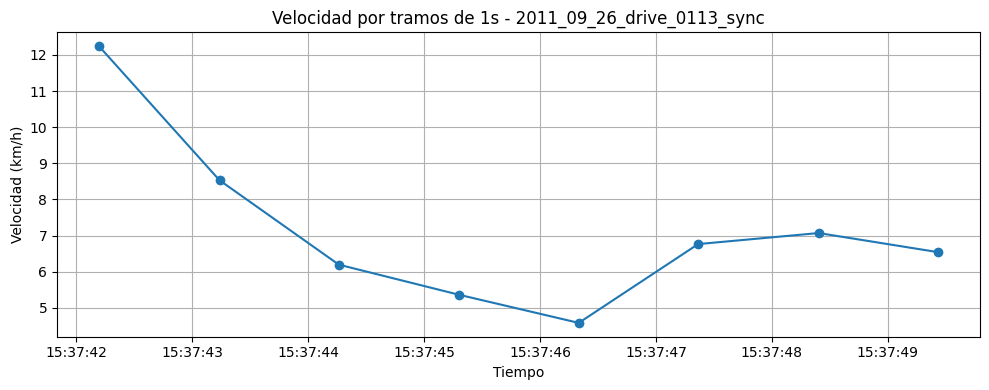

In [25]:
for route in ['2011_09_26_drive_0001_sync', '2011_09_26_drive_0013_sync', '2011_09_26_drive_0113_sync']:
    print(f"\n📊 Análisis de velocidad por tramos - {route}")
    gps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/data')
    gps_files = sorted(glob.glob(os.path.join(gps_path, '*.txt')))

    latitude = []
    longitude = []
    altitude = []

    for f in gps_files:
        with open(f, 'r') as file:
            vals = file.read().split()
            latitude.append(float(vals[0]))
            longitude.append(float(vals[1]))
            altitude.append(float(vals[2]))

    x, y, z = zip(*[geodetic_to_ecef(lat, lon, alt) for lat, lon, alt in zip(latitude, longitude, altitude)])

    timestamps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/timestamps.txt')
    with open(timestamps_path, 'r') as f:
        timestamps = [datetime.fromisoformat(line.strip()) for line in f]

    # Calcular velocidades por tramos de 1 segundo
    tramo_tiempos, tramo_velocidades = velocidad_por_tramos_temporales(timestamps, x, y, z, intervalo=1)

    # Graficar velocidades por tramos
    plt.figure(figsize=(10, 4))
    plt.plot(tramo_tiempos, tramo_velocidades, marker='o')
    plt.title(f'Velocidad por tramos de 1s - {route}')
    plt.xlabel('Tiempo')
    plt.ylabel('Velocidad (km/h)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


En la primera grafica vemos que la velocidad va bajando poco a poco, esto podemos comprobar que está bien, ya que al final del video se ve que hay un semáforo en rojo y por tanto va reduciendo la velocidad.

En el segundo caso vemos que más o menos mantiene la velocidad y una vez cambia de carril ya acelera un poco mas y sube la velocidad.

En el tercer caso vemos que el punto mas bajo en la velocidad es cuando se encuentra al ciclista en la zona estrecha, luego como quiere dar el giro aumenta la velocidad pero por falta de espacio y visibilidad sigue yendo muy despacio

📍 Procesando ruta: 2011_09_26_drive_0001_sync


<ipython-input-26-344a61045ed4>:99: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-26-344a61045ed4>:99: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-26-344a61045ed4>:99: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


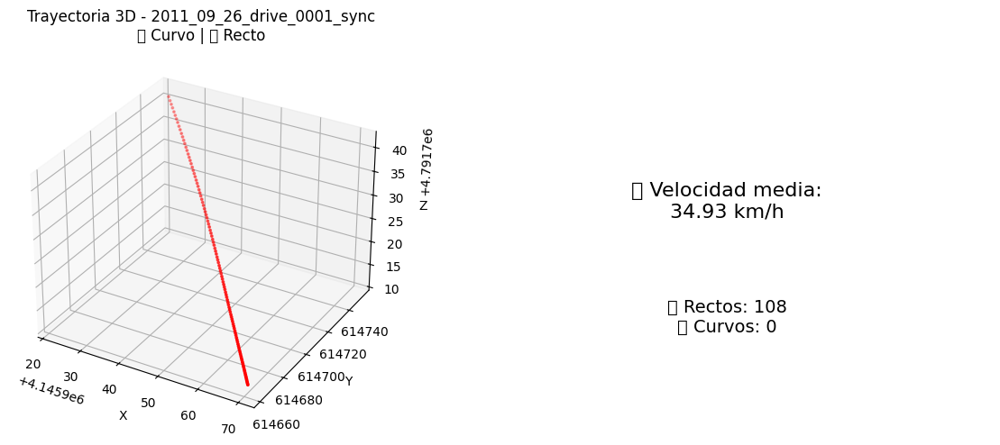

📍 Procesando ruta: 2011_09_26_drive_0013_sync


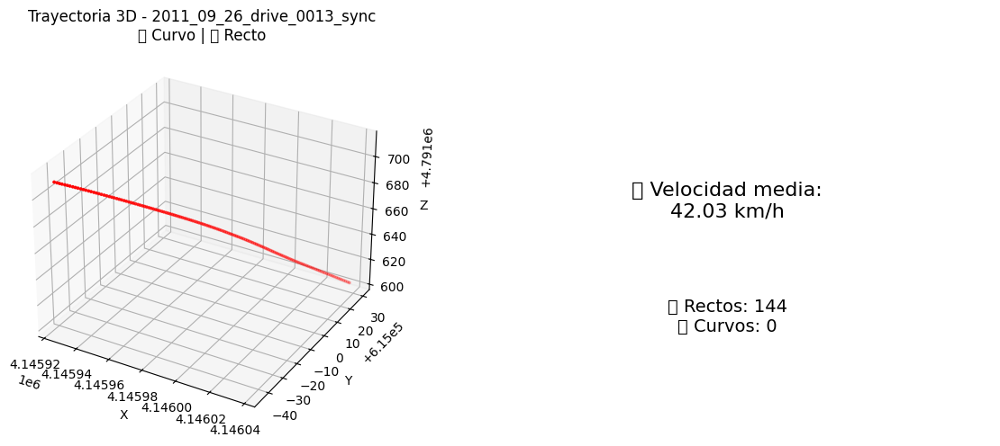

📍 Procesando ruta: 2011_09_26_drive_0113_sync


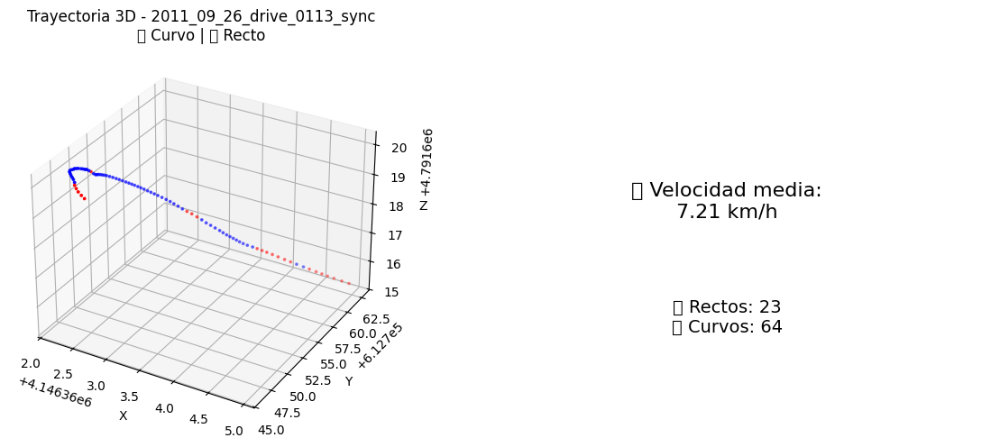

In [26]:
from datetime import datetime
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import os
import glob

def geodetic_to_ecef(lat, lon, alt):
    a = 6378137
    b = 6356752.3142
    e_sq = 1 - (b**2 / a**2)

    lat_rad = np.radians(lat)
    lon_rad = np.radians(lon)
    N = a / np.sqrt(1 - e_sq * np.sin(lat_rad)**2)

    X = (N + alt) * np.cos(lat_rad) * np.cos(lon_rad)
    Y = (N + alt) * np.cos(lat_rad) * np.sin(lon_rad)
    Z = ((b**2 / a**2) * N + alt) * np.sin(lat_rad)

    return X, Y, Z

def detectar_tramos_curvos(x, y, z, umbral_angulo=2, ventana=5):
    tipos = []
    for i in range(ventana, len(x) - ventana):
        p1 = np.array([x[i] - x[i - ventana], y[i] - y[i - ventana], z[i] - z[i - ventana]])
        p2 = np.array([x[i + ventana] - x[i], y[i + ventana] - y[i], z[i + ventana] - z[i]])

        norm1 = np.linalg.norm(p1)
        norm2 = np.linalg.norm(p2)
        if norm1 == 0 or norm2 == 0:
            tipos.append('recto')
            continue

        cos_angle = np.clip(np.dot(p1, p2) / (norm1 * norm2), -1, 1)
        angle_deg = np.degrees(np.arccos(cos_angle))

        tipo = 'curvo' if angle_deg > umbral_angulo else 'recto'
        tipos.append(tipo)

    return ['recto'] * ventana + tipos + ['recto'] * ventana

# Procesar cada ruta
for route in ['2011_09_26_drive_0001_sync', '2011_09_26_drive_0013_sync', '2011_09_26_drive_0113_sync']:
    print(f"📍 Procesando ruta: {route}")
    gps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/data')
    gps_files = sorted(glob.glob(os.path.join(gps_path, '*.txt')))

    latitude = []
    longitude = []
    altitude = []

    for f in gps_files:
        with open(f, 'r') as file:
            vals = file.read().split()
            latitude.append(float(vals[0]))
            longitude.append(float(vals[1]))
            altitude.append(float(vals[2]))

    x, y, z = zip(*[geodetic_to_ecef(lat, lon, alt) for lat, lon, alt in zip(latitude, longitude, altitude)])

    timestamps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/timestamps.txt')
    with open(timestamps_path, 'r') as f:
        timestamps = [datetime.fromisoformat(line.strip()) for line in f]

    assert len(timestamps) == len(x), "❌ Mismatch entre coordenadas y timestamps."

    distancias = [np.linalg.norm(np.array([x[i+1], y[i+1], z[i+1]]) - np.array([x[i], y[i], z[i]]))
                  for i in range(len(x)-1)]
    tiempo_total = (timestamps[-1] - timestamps[0]).total_seconds()
    distancia_total = sum(distancias)
    velocidad_media = (distancia_total / tiempo_total) * 3.6 if tiempo_total > 0 else 0

    # Detectar tramos curvos o rectos
    tipos_tramos = detectar_tramos_curvos(x, y, z, umbral_angulo=2, ventana=5)

    # Preparar colores para el plot según tipo
    colores = ['blue' if t == 'curvo' else 'red' for t in tipos_tramos]

    # Plot 3D
    fig = plt.figure(figsize=(12, 5))
    ax = fig.add_subplot(121, projection='3d')
    ax.scatter(x, y, z, c=colores, s=3)
    ax.set_title(f'Trayectoria 3D - {route}\n🔵 Curvo | 🔴 Recto')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # Mostrar velocidad media
    ax2 = fig.add_subplot(122)
    ax2.axis('off')
    ax2.text(0.5, 0.6, f"🚗 Velocidad media:\n{velocidad_media:.2f} km/h", fontsize=16, ha='center', va='center')

    # Mostrar conteo de tramos
    cant_curvos = colores.count('blue')
    cant_rectos = colores.count('red')
    ax2.text(0.5, 0.3, f"🔴 Rectos: {cant_rectos}\n🔵 Curvos: {cant_curvos}", fontsize=14, ha='center', va='center')

    plt.tight_layout()
    plt.show()


Vemos en los 2 primeros casos que no detecta curvas, esto pasa porque las curvas no deben superar los 2 grados de giro (umbral de giro utilizado), y sin embargo en el ultimo caso si que se considera que hay curvas, ya que estas son mucho mas pronunciadas que en los casos anteriores.

Se podria considerar que en el segundo caso en el cambio de carril hace un giro, pero el programa no lo detecta.


📍 Procesando ruta: 2011_09_26_drive_0001_sync


<ipython-input-27-bd9797d80bcf>:90: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96])
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


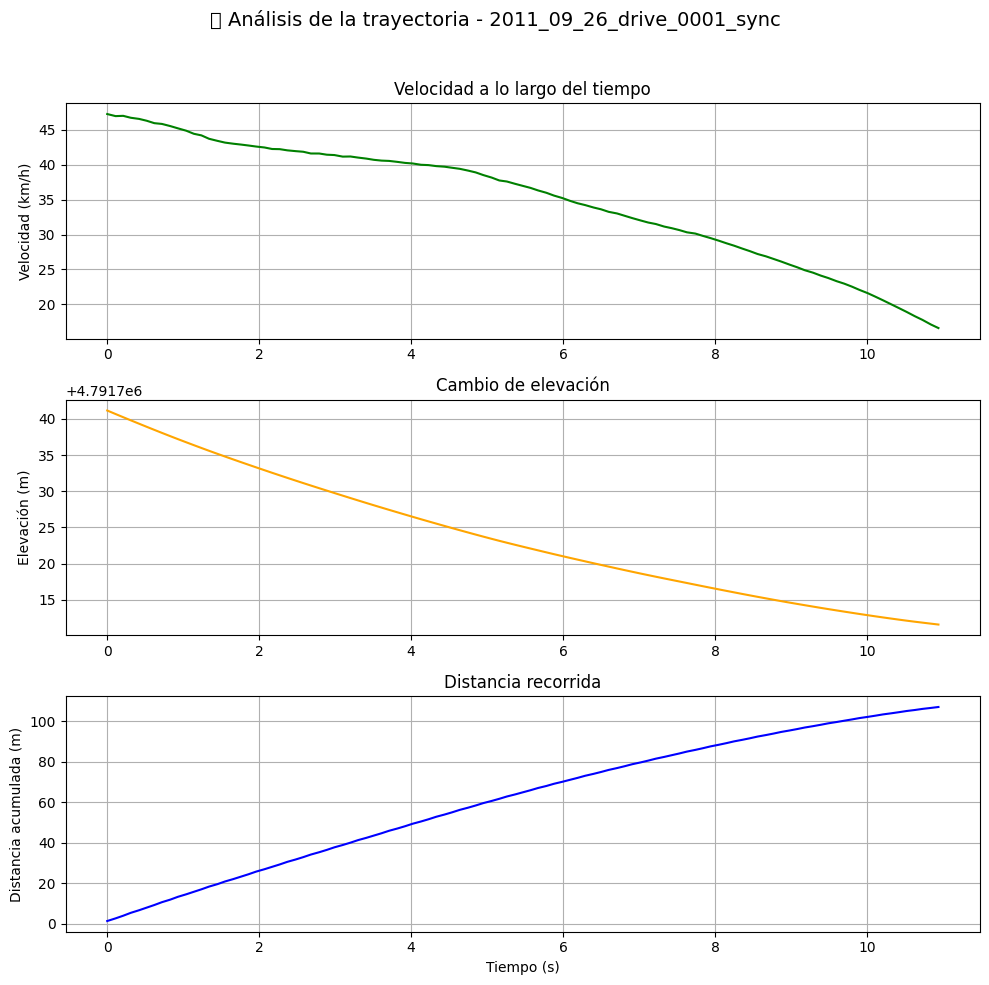

📈 Resumen de análisis de 2011_09_26_drive_0001_sync:
→ Distancia total: 107.12 metros
→ Elevación inicial: 4791741.16 m
→ Elevación final:   4791711.45 m
→ Cambio de elevación: -29.71 m
→ Elevación máxima: 4791741.16 m
→ Elevación mínima: 4791711.45 m
→ Velocidad media: 34.93 km/h
——————————————————————————————————————————————————

📍 Procesando ruta: 2011_09_26_drive_0013_sync


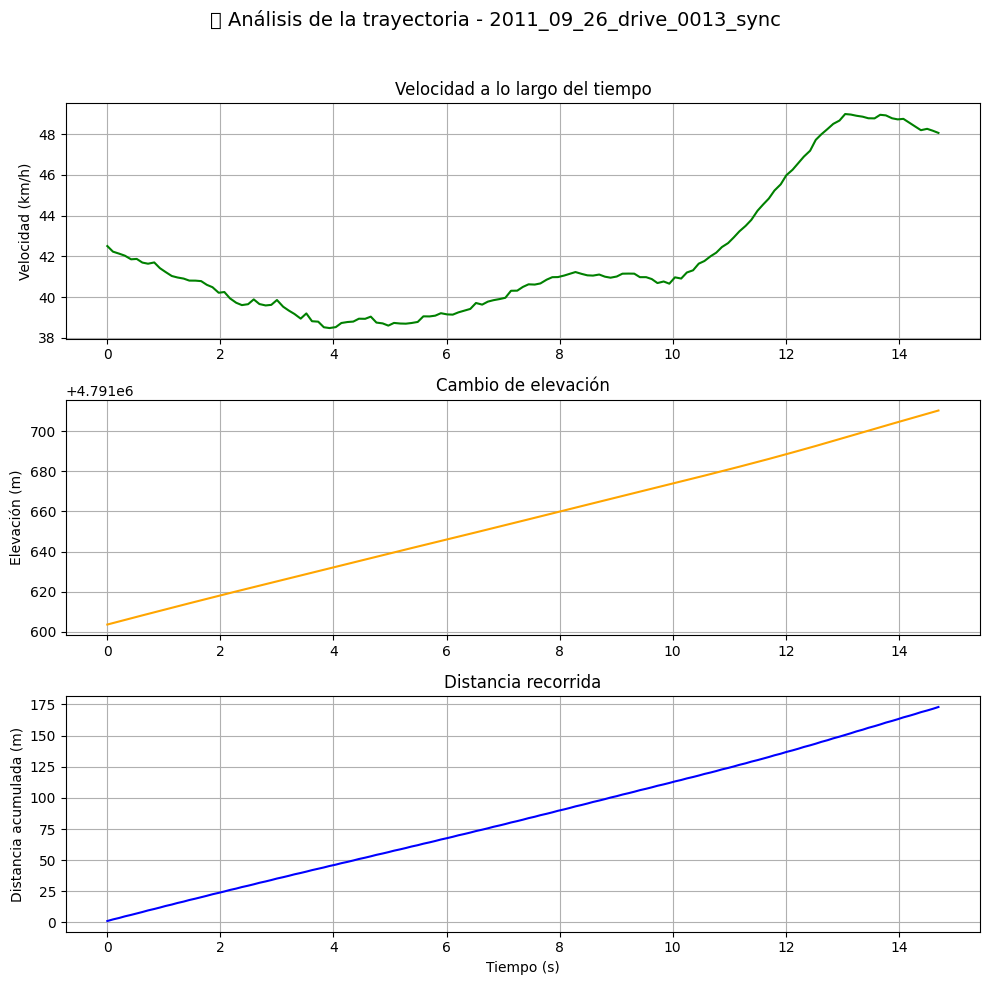

📈 Resumen de análisis de 2011_09_26_drive_0013_sync:
→ Distancia total: 172.89 metros
→ Elevación inicial: 4791603.56 m
→ Elevación final:   4791711.29 m
→ Cambio de elevación: 107.73 m
→ Elevación máxima: 4791711.29 m
→ Elevación mínima: 4791603.56 m
→ Velocidad media: 42.03 km/h
——————————————————————————————————————————————————

📍 Procesando ruta: 2011_09_26_drive_0113_sync


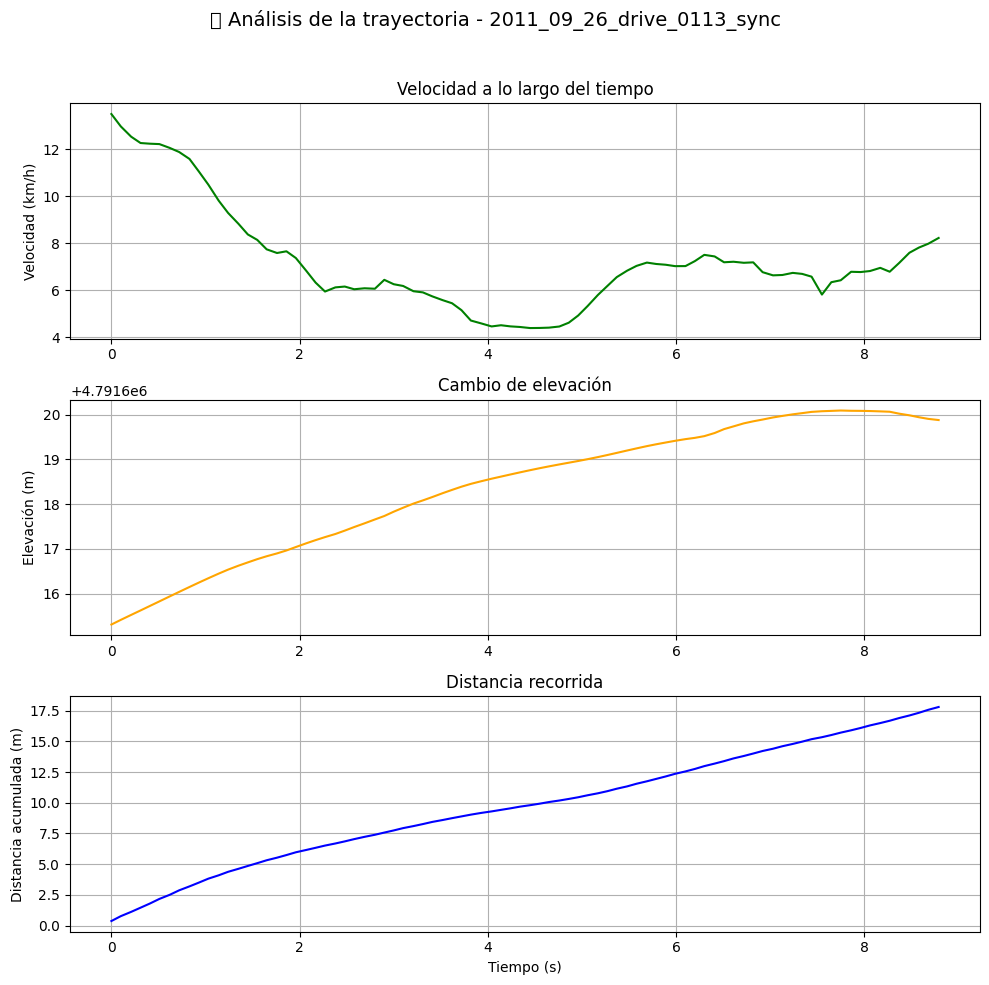

📈 Resumen de análisis de 2011_09_26_drive_0113_sync:
→ Distancia total: 17.80 metros
→ Elevación inicial: 4791615.31 m
→ Elevación final:   4791619.86 m
→ Cambio de elevación: 4.55 m
→ Elevación máxima: 4791620.09 m
→ Elevación mínima: 4791615.31 m
→ Velocidad media: 7.21 km/h
——————————————————————————————————————————————————


In [27]:
from datetime import datetime
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import os
import glob

def geodetic_to_ecef(lat, lon, alt):
    a = 6378137
    b = 6356752.3142
    e_sq = 1 - (b**2 / a**2)

    lat_rad = np.radians(lat)
    lon_rad = np.radians(lon)
    N = a / np.sqrt(1 - e_sq * np.sin(lat_rad)**2)

    X = (N + alt) * np.cos(lat_rad) * np.cos(lon_rad)
    Y = (N + alt) * np.cos(lat_rad) * np.sin(lon_rad)
    Z = ((b**2 / a**2) * N + alt) * np.sin(lat_rad)

    return X, Y, Z

# --- Análisis para cada ruta ---
for route in ['2011_09_26_drive_0001_sync', '2011_09_26_drive_0013_sync', '2011_09_26_drive_0113_sync']:
    print(f"\n📍 Procesando ruta: {route}")
    gps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/data')
    gps_files = sorted(glob.glob(os.path.join(gps_path, '*.txt')))

    latitude = []
    longitude = []
    altitude = []

    for f in gps_files:
        with open(f, 'r') as file:
            vals = file.read().split()
            latitude.append(float(vals[0]))
            longitude.append(float(vals[1]))
            altitude.append(float(vals[2]))

    x, y, z = zip(*[geodetic_to_ecef(lat, lon, alt) for lat, lon, alt in zip(latitude, longitude, altitude)])

    timestamps_path = os.path.join(dataset_path, f'kitti_data/car_routes/{route}/oxts/timestamps.txt')
    with open(timestamps_path, 'r') as f:
        timestamps = [datetime.fromisoformat(line.strip()) for line in f]

    assert len(timestamps) == len(x), "❌ Mismatch entre coordenadas y timestamps."

    distancias = [np.linalg.norm(np.array([x[i+1], y[i+1], z[i+1]]) - np.array([x[i], y[i], z[i]]))
                  for i in range(len(x)-1)]
    tiempo_total = (timestamps[-1] - timestamps[0]).total_seconds()
    distancia_total = sum(distancias)
    velocidad_media = (distancia_total / tiempo_total) * 3.6 if tiempo_total > 0 else 0

    # --- Análisis adicional de la trayectoria ---
    velocidades = [dist / (timestamps[i+1] - timestamps[i]).total_seconds() if (timestamps[i+1] - timestamps[i]).total_seconds() > 0 else 0
                   for i, dist in enumerate(distancias)]
    velocidades_kmh = [v * 3.6 for v in velocidades]

    elevaciones = [z[i+1] - z[i] for i in range(len(z)-1)]
    elevacion_total = z[-1] - z[0]
    elevacion_maxima = max(z)
    elevacion_minima = min(z)

    # Plot del análisis
    fig, axs = plt.subplots(3, 1, figsize=(10, 10))
    fig.suptitle(f'📊 Análisis de la trayectoria - {route}', fontsize=14)

    tiempos_relativos = [(t - timestamps[0]).total_seconds() for t in timestamps[:-1]]

    # 1. Velocidad
    axs[0].plot(tiempos_relativos, velocidades_kmh, color='green')
    axs[0].set_ylabel('Velocidad (km/h)')
    axs[0].set_title('Velocidad a lo largo del tiempo')
    axs[0].grid(True)

    # 2. Elevación
    axs[1].plot(tiempos_relativos, z[:-1], color='orange')
    axs[1].set_ylabel('Elevación (m)')
    axs[1].set_title('Cambio de elevación')
    axs[1].grid(True)

    # 3. Distancia acumulada
    distancia_acumulada = np.cumsum(distancias)
    axs[2].plot(tiempos_relativos, distancia_acumulada, color='blue')
    axs[2].set_ylabel('Distancia acumulada (m)')
    axs[2].set_xlabel('Tiempo (s)')
    axs[2].set_title('Distancia recorrida')
    axs[2].grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # Mostrar resumen estadístico
    print(f"📈 Resumen de análisis de {route}:")
    print(f"→ Distancia total: {distancia_total:.2f} metros")
    print(f"→ Elevación inicial: {z[0]:.2f} m")
    print(f"→ Elevación final:   {z[-1]:.2f} m")
    print(f"→ Cambio de elevación: {elevacion_total:.2f} m")
    print(f"→ Elevación máxima: {elevacion_maxima:.2f} m")
    print(f"→ Elevación mínima: {elevacion_minima:.2f} m")
    print(f"→ Velocidad media: {velocidad_media:.2f} km/h")
    print("—" * 50)


Viendo esto, vemos que los 2 primeros recorren mas metros, el primero mas que el segundo, ya que iban a una velocidad mucho mayor durante mas tiempo.

Vemso que en la primera ruta se recorre una cuesta abajo, en la segunda es cuesta arriba linealmente y en el ultimo caso vemos que sube pero luego se estabiliza y al final incluso baja un poco, al ser tan pocos metros los que recorre se puede incluso suponer que puede ser un bache.

Respecto a la velocidad, como ya fue analizada anteriormente se puede resumir en: el primero baja la velocidad de manera constante, el segundo mantiene una velocidad mas o menos estable y cuando adelanta sube la velocidad, por ultimo, en el ultimo caso se va muy despacio ya que si vas muy rapido te puedes chocar y producir un accidente.


#4 HACER TODOS LOS EJERCICIOS CON EL DATASET DADO

In [28]:
ruta_long = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence'
image_files = sorted(glob.glob(f'{ruta_long}/image_2/*.png'))
lidar_files = sorted(glob.glob(f'{ruta_long}/velodyne/*.bin'))

In [29]:


# Leer archivo de calibración
def read_kitti_calib(filepath):
    data = {}
    with open(filepath, 'r') as f:
        for line in f.readlines():
            key, value = line.strip().split(':', 1)
            data[key] = np.array([float(x) for x in value.strip().split()])
    return data

def project_lidar_to_image(points, calib):
    Tr = calib['Tr'].reshape(3, 4)
    Tr = np.vstack((Tr, [0, 0, 0, 1]))  # 4x4
    R0 = calib['R0']                   # 4x4 identidad
    P = calib['P2'].reshape(3, 4)

    pts_hom = np.hstack((points[:, :3], np.ones((points.shape[0], 1)))).T  # (4,N)
    pts_cam = R0 @ Tr @ pts_hom
    pts_cam = pts_cam[:3, :]

    pts_2d = P @ np.vstack((pts_cam, np.ones((pts_cam.shape[1]))))
    pts_2d = pts_2d[:2] / pts_2d[2]
    return pts_2d.T, pts_cam.T


In [30]:
calib_path = f'{ruta_long}/calib.txt'
calib_raw = read_kitti_calib(calib_path)

calib = {
    'P2': calib_raw['P2'],
    'Tr': calib_raw['Tr'],
    'R0': np.eye(4)  # Asumimos identidad completa
}


In [31]:
def load_from_bin(bin_path):
    return np.fromfile(bin_path, dtype=np.float32).reshape(-1, 4)

In [32]:
model = YOLO('yolov8n.pt')
processed_images = []

for i in range(10):
    image = cv2.imread(image_files[i])
    lidar = load_from_bin(lidar_files[i])

    proj_pts, pts_cam = project_lidar_to_image(lidar, calib)

    result = model.predict(image, verbose=False)[0]
    img_draw = image.copy()

    # Dibujar puntos LIDAR
    for x, y in proj_pts:
        x, y = int(x), int(y)
        if 0 <= x < image.shape[1] and 0 <= y < image.shape[0]:
            cv2.circle(img_draw, (x, y), 1, (255, 0, 0), -1)

    # Dibujar predicciones de YOLO y estimar distancias
    for box in result.boxes:
        cls = model.names[int(box.cls)]
        conf = float(box.conf)
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Filtrar puntos proyectados que estén dentro de la caja
        mask = (proj_pts[:, 0] >= x1) & (proj_pts[:, 0] <= x2) & \
       (proj_pts[:, 1] >= y1) & (proj_pts[:, 1] <= y2)

        selected_points = pts_cam[mask]

        if len(selected_points) > 0:
          dists = np.linalg.norm(selected_points, axis=1)
          dist = np.percentile(dists, 10)
          label = f"{cls} ({conf:.2f}) - {dist:.1f}m"
        else:
          label = f"{cls} ({conf:.2f}) - ❌"

        cv2.putText(img_draw, label, (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    processed_images.append(cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB))

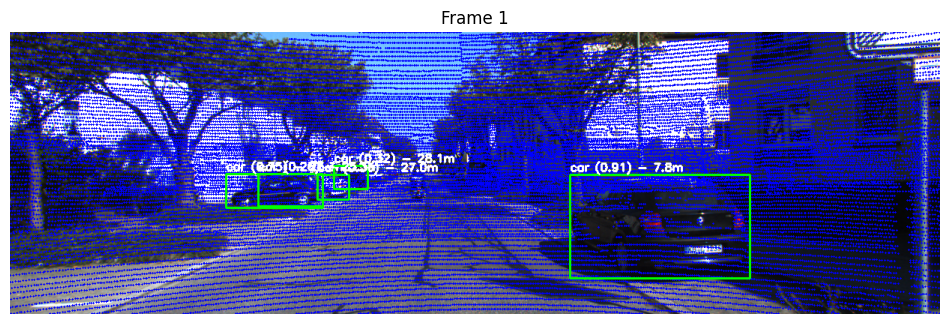

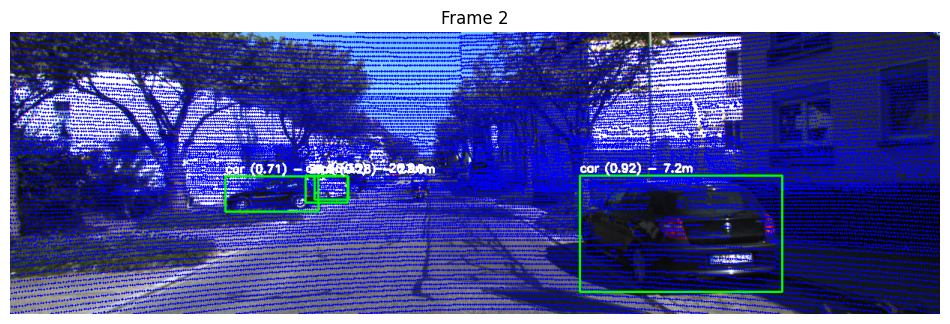

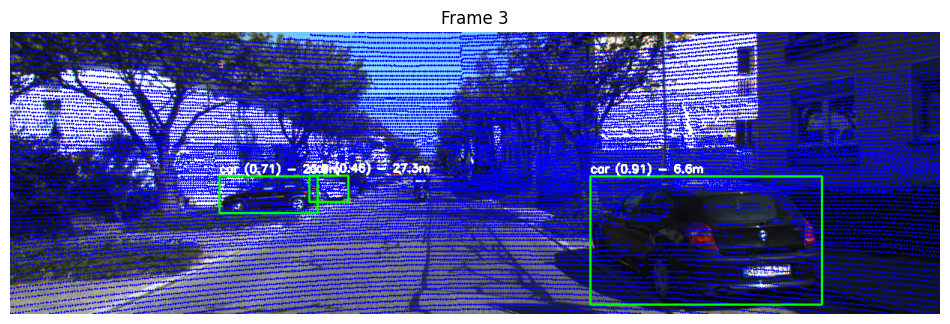

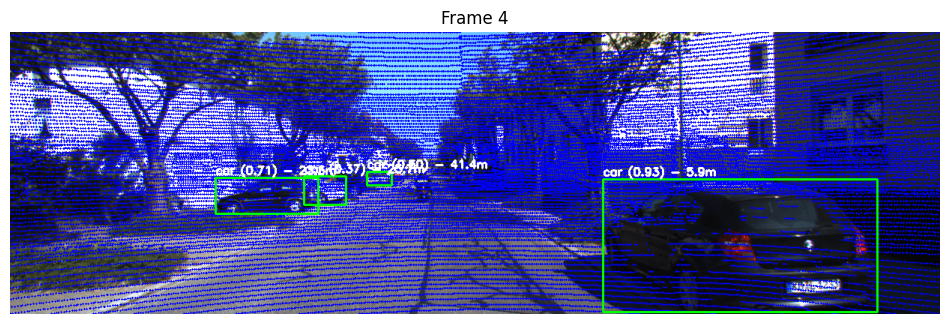

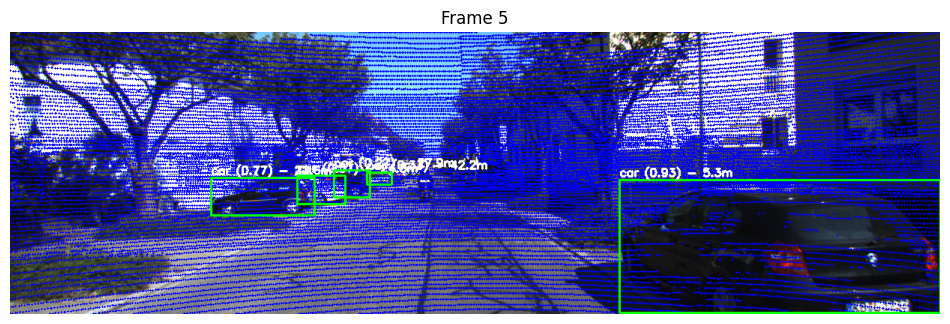

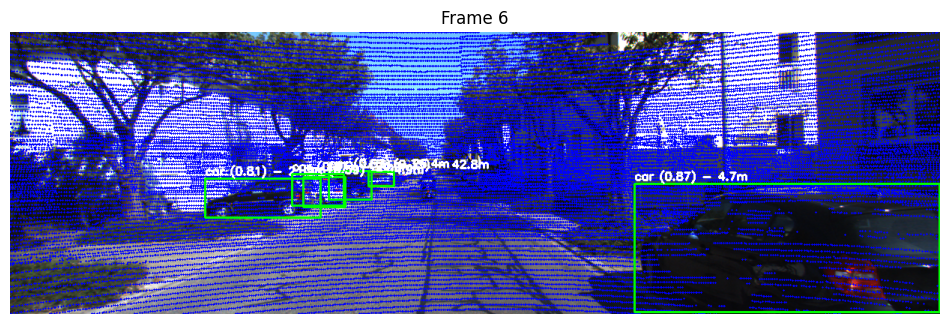

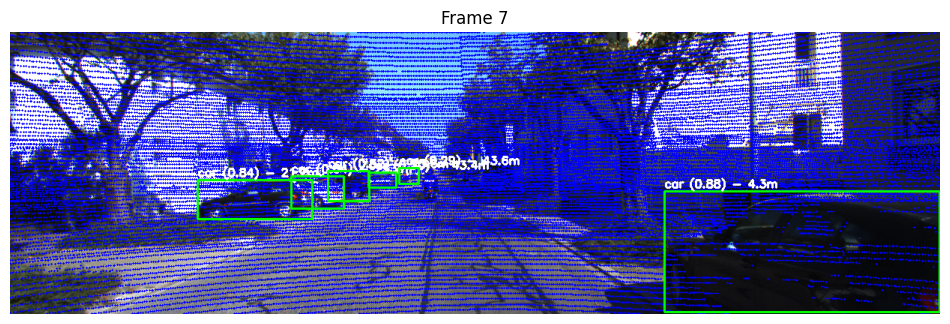

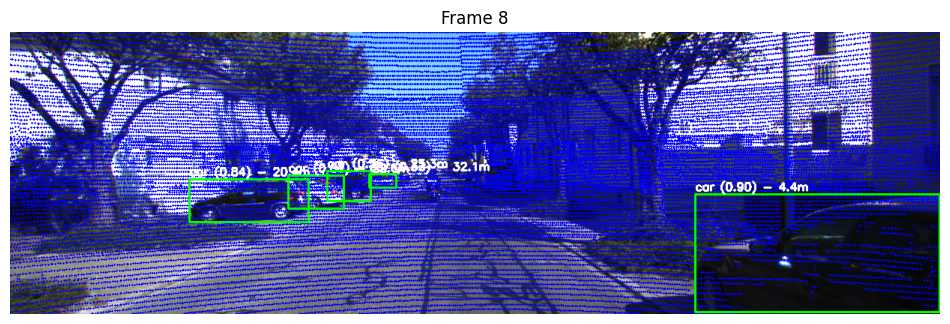

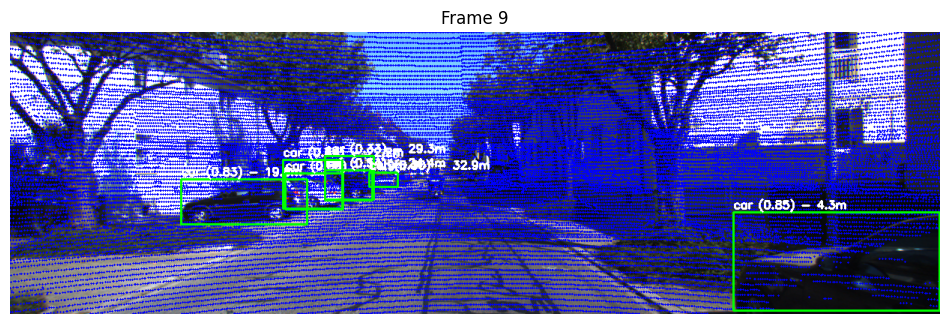

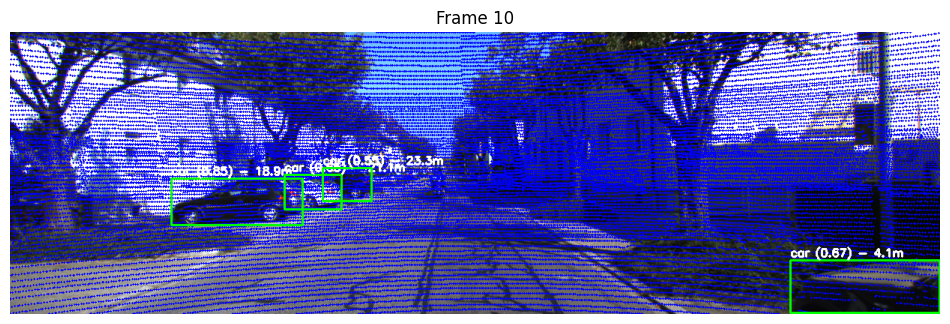

In [33]:
for i, img in enumerate(processed_images):
    plt.figure(figsize=(12, 6))
    plt.imshow(img)
    plt.title(f"Frame {i+1}")
    plt.axis("off")
    plt.show()

Vemos que reconoce todos los coches en las cajas y con la distancia, pero no reconoce la moto que tiene justo delante, cosa que deberia reconocer por el sensor de puntos y por el algoritmo de reconocimiento

In [34]:
# Inspección de data_odometry_poses.txt
ruta_poses = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence/data_odometry_poses.txt'

print("📌 Primeras 5 líneas de data_odometry_poses.txt:\n")
with open(ruta_poses, 'r') as f:
    for i in range(5):
        linea = f.readline().strip()
        valores = linea.split()
        print(f"Línea {i}:")
        print(f"Número de columnas: {len(valores)}")
        print(f"Valores: {valores}")
        print()

# Inspección de times.txt
ruta_times = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence/times.txt'

print("📌 Primeras 5 líneas de times.txt:\n")
with open(ruta_times, 'r') as f:
    for i in range(5):
        linea = f.readline().strip()
        print(f"Línea {i}: {linea}")


📌 Primeras 5 líneas de data_odometry_poses.txt:

Línea 0:
Número de columnas: 12
Valores: ['1.000000e+00', '9.043680e-12', '2.326809e-11', '5.551115e-17', '9.043683e-12', '1.000000e+00', '2.392370e-10', '3.330669e-16', '2.326810e-11', '2.392370e-10', '9.999999e-01', '-4.440892e-16']

Línea 1:
Número de columnas: 12
Valores: ['9.999978e-01', '5.272628e-04', '-2.066935e-03', '-4.690294e-02', '-5.296506e-04', '9.999992e-01', '-1.154865e-03', '-2.839928e-02', '2.066324e-03', '1.155958e-03', '9.999971e-01', '8.586941e-01']

Línea 2:
Número de columnas: 12
Valores: ['9.999910e-01', '1.048972e-03', '-4.131348e-03', '-9.374345e-02', '-1.058514e-03', '9.999968e-01', '-2.308104e-03', '-5.676064e-02', '4.128913e-03', '2.312456e-03', '9.999887e-01', '1.716275e+00']

Línea 3:
Número de columnas: 12
Valores: ['9.999796e-01', '1.566466e-03', '-6.198571e-03', '-1.406429e-01', '-1.587952e-03', '9.999927e-01', '-3.462706e-03', '-8.515762e-02', '6.193102e-03', '3.472479e-03', '9.999747e-01', '2.574964e+0

<ipython-input-35-aa500b04d616>:60: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


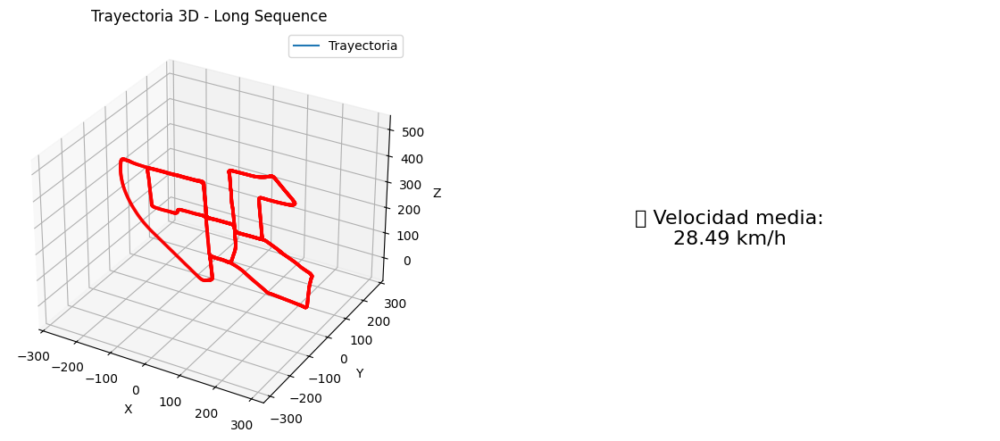

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def set_axes_equal(ax):
    '''Iguala la escala de los ejes 3D para que no haya distorsión.'''
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    centers = np.mean(limits, axis=1)
    radius = 0.5 * np.max(limits[:, 1] - limits[:, 0])
    for center, axis in zip(centers, [ax.set_xlim3d, ax.set_ylim3d, ax.set_zlim3d]):
        axis([center - radius, center + radius])

# Rutas de archivos
base_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence'
poses_path = f'{base_path}/data_odometry_poses.txt'
times_path = f'{base_path}/times.txt'

# Leer posiciones desde data_odometry_poses.txt
positions = []
with open(poses_path, 'r') as f:
    for line in f:
        vals = list(map(float, line.strip().split()))
        x, y, z = vals[3], vals[7], vals[11]
        positions.append([x, y, z])
positions = np.array(positions)

# Leer tiempos desde times.txt
with open(times_path, 'r') as f:
    tiempos = [float(line.strip()) for line in f]

# Validación
assert len(tiempos) == len(positions), "❌ Mismatch entre posiciones y tiempos"

# Calcular distancias y velocidad media
distancias = [np.linalg.norm(positions[i+1] - positions[i]) for i in range(len(positions) - 1)]
tiempo_total = tiempos[-1] - tiempos[0]
distancia_total = sum(distancias)
velocidad_media = (distancia_total / tiempo_total) * 3.6 if tiempo_total > 0 else 0  # km/h

# Visualización
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(121, projection='3d')
ax.plot(positions[:, 0], positions[:, 1], positions[:, 2], label='Trayectoria')
ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], color='r', s=3)
set_axes_equal(ax)  # <<< Aquí se ajustan las escalas
ax.set_title('Trayectoria 3D - Long Sequence')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()

ax2 = fig.add_subplot(122)
ax2.axis('off')
ax2.text(0.5, 0.5, f"🚗 Velocidad media:\n{velocidad_media:.2f} km/h",
         fontsize=16, ha='center', va='center')
plt.tight_layout()
plt.show()


Vemos que el recorrido es como el de la presentacion, por lo que suponemos que esta bien hecho, la velocidad tambien tiene sentido, ya que en las rectas se acelera mas que esa velocidad y en las curvas se frena, al ser en ciudad el resultado tiene sentido.

Además, mas adelante con los graficos veremos que si tiene sentido.

In [36]:
import os

# Ruta a la carpeta image_2
image_dir = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence/image_2'

# Contar solo archivos .png (puedes ajustar si hay otro formato)
image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]

print(f"📸 Número de imágenes en image_2: {len(image_files)}")


📸 Número de imágenes en image_2: 4541


In [37]:
import os
import glob
import cv2
import time
import imageio
import numpy as np
from IPython.display import HTML
from IPython.display import display

# Crea función para mostrar el video en notebook
def display_video(frames, fps=10):
    """Convierte lista de frames a video HTML5 embebido."""
    video_path = '/content/temp_video.mp4'
    imageio.mimsave(video_path, frames, fps=fps)
    return HTML(f"""
    <video width="640" height="360" controls>
      <source src="{video_path}" type="video/mp4">
    </video>
    """)

# Rutas
drive_image_folder = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence/image_2'
local_image_folder = '/content/image_2'
!cp -r "{drive_image_folder}" "{local_image_folder}"

# Obtener y ordenar imágenes (una sí y una no)
image_files = sorted(glob.glob(os.path.join(local_image_folder, '*.png')))
image_files = image_files[::2]  # <- solo cada dos imágenes

# Leer las imágenes como frames
frames = []
for img_path in image_files:
    frame = cv2.imread(img_path)
    if frame is not None:
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)

# Mostrar video en la celda
display(display_video(frames, fps=10))


<ipython-input-38-a94f456b743e>:43: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


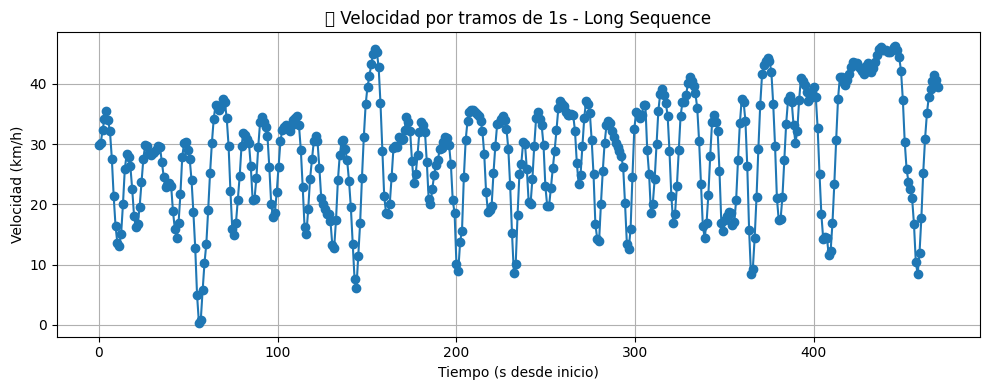

In [38]:
from datetime import timedelta

def velocidad_por_tramos_temporales(tiempos, x, y, z, intervalo=1):
    tiempos_tramo = []
    velocidades_tramo = []

    inicio = 0
    while inicio < len(tiempos) - 1:
        tiempo_inicio = tiempos[inicio]
        j = inicio + 1
        # Buscar el siguiente índice que esté al menos a "intervalo" segundos de distancia
        while j < len(tiempos) and tiempos[j] - tiempo_inicio < intervalo:
            j += 1
        if j >= len(tiempos):
            break
        # Calcular distancia entre puntos de inicio y j
        dx = x[j] - x[inicio]
        dy = y[j] - y[inicio]
        dz = z[j] - z[inicio]
        distancia = np.sqrt(dx**2 + dy**2 + dz**2)
        tiempo_segundos = tiempos[j] - tiempo_inicio
        velocidad = (distancia / tiempo_segundos) * 3.6  # m/s → km/h

        # Guardar resultados
        tiempos_tramo.append(tiempos[inicio])
        velocidades_tramo.append(velocidad)

        inicio = j  # Mover al siguiente tramo

    return tiempos_tramo, velocidades_tramo

# Aplicar la función a tus datos
x, y, z = positions[:, 0], positions[:, 1], positions[:, 2]
tramo_tiempos, tramo_velocidades = velocidad_por_tramos_temporales(tiempos, x, y, z, intervalo=1)

# Graficar resultados
plt.figure(figsize=(10, 4))
plt.plot(tramo_tiempos, tramo_velocidades, marker='o', linestyle='-')
plt.title('📊 Velocidad por tramos de 1s - Long Sequence')
plt.xlabel('Tiempo (s desde inicio)')
plt.ylabel('Velocidad (km/h)')
plt.grid(True)
plt.tight_layout()
plt.show()


Viendo la grafica tiene sentido, ya que en las curvas o si el coche de delante se frena, y cuando hay rectas acelera mas, como curiosidad vemos que solo frena hasta 0 km/h una vez en el recorrido y siempre va acelerando y frenando, vemos que el patron se repite en algunos tramos.

<ipython-input-39-fb6ec67019c4>:42: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-39-fb6ec67019c4>:42: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-39-fb6ec67019c4>:42: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


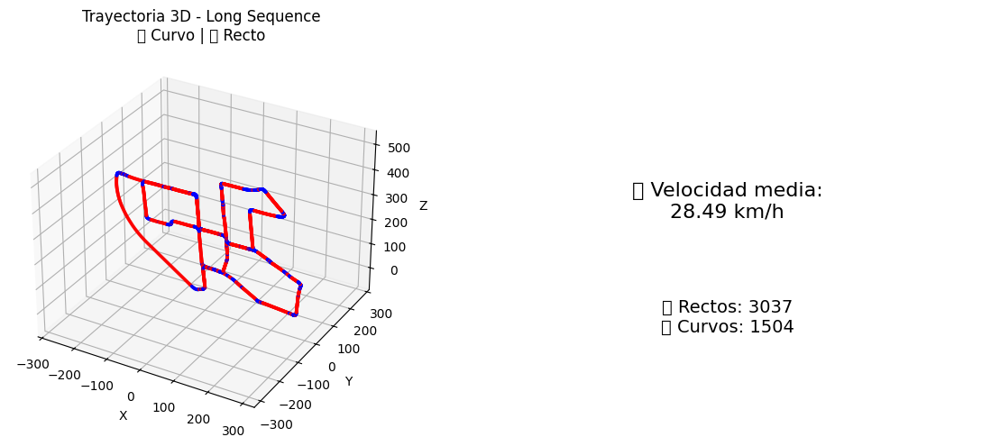

In [39]:
def set_axes_equal(ax):
    '''Ajusta la escala de los ejes X, Y, Z para que se vean correctamente proporcionales.'''
    limits = np.array([
        ax.get_xlim3d(),
        ax.get_ylim3d(),
        ax.get_zlim3d(),
    ])
    centers = np.mean(limits, axis=1)
    radius = 0.5 * np.max(limits[:, 1] - limits[:, 0])
    for center, axis in zip(centers, [ax.set_xlim3d, ax.set_ylim3d, ax.set_zlim3d]):
        axis([center - radius, center + radius])

# Coordenadas
x, y, z = positions[:, 0], positions[:, 1], positions[:, 2]

# Detección de tramos curvos
tipos_tramos = detectar_tramos_curvos(x, y, z, umbral_angulo=2, ventana=5)
colores = ['blue' if t == 'curvo' else 'red' for t in tipos_tramos]

# Cálculo de velocidad media
distancias = [np.linalg.norm(positions[i+1] - positions[i]) for i in range(len(positions) - 1)]
tiempo_total = tiempos[-1] - tiempos[0]
distancia_total = sum(distancias)
velocidad_media = (distancia_total / tiempo_total) * 3.6 if tiempo_total > 0 else 0

# Visualización
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(121, projection='3d')
ax.scatter(x, y, z, c=colores, s=3)
set_axes_equal(ax)  # <<< Aquí se iguala la escala
ax.set_title('Trayectoria 3D - Long Sequence\n🔵 Curvo | 🔴 Recto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Panel de información
ax2 = fig.add_subplot(122)
ax2.axis('off')
ax2.text(0.5, 0.6, f"🚗 Velocidad media:\n{velocidad_media:.2f} km/h", fontsize=16, ha='center', va='center')
ax2.text(0.5, 0.3, f"🔴 Rectos: {colores.count('red')}\n🔵 Curvos: {colores.count('blue')}", fontsize=14, ha='center', va='center')

plt.tight_layout()
plt.show()


En este grafico se ve como el programa reconoce bien las curvas pronunciadas, sobre todo en las que se baja mucho la velocidad, tambien hay algun punto en la recta en la que se detecta una curva, suponemos que es porque adelanta un coche y lo detecta como una curva

<ipython-input-40-6d06c1748ff8>:65: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


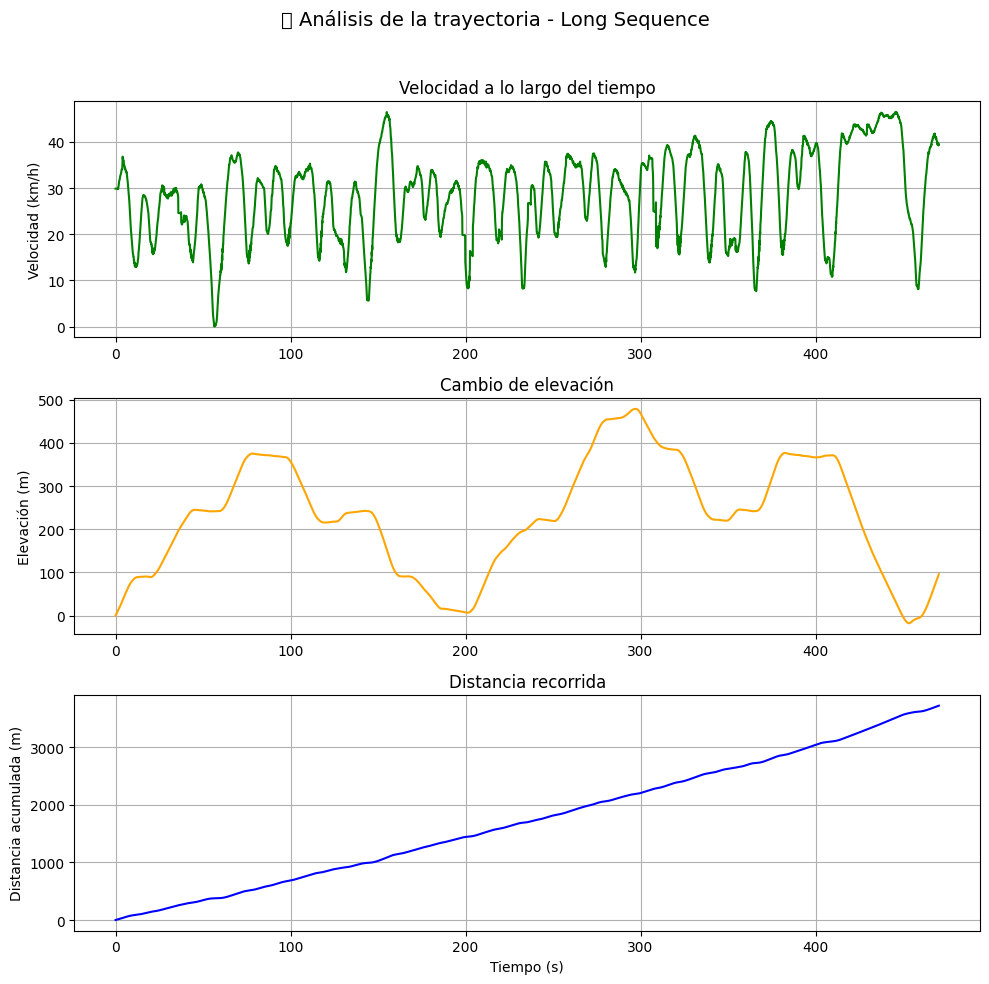

📈 Resumen del análisis:
→ Distancia total:       3724.19 metros
→ Elevación inicial:     -0.00 m
→ Elevación final:       96.96 m
→ Cambio de elevación:   96.96 m
→ Elevación máxima:      478.59 m
→ Elevación mínima:      -17.60 m
→ Velocidad media:       28.49 km/h
——————————————————————————————————————————————————


In [40]:
import numpy as np
import matplotlib.pyplot as plt

# Rutas de tus archivos
base_path = '/content/drive/MyDrive/APSE/4.2.2_kitti_dataset/long_sequence'
poses_path = f'{base_path}/data_odometry_poses.txt'
times_path = f'{base_path}/times.txt'

# Leer posiciones desde data_odometry_poses.txt
positions = []
with open(poses_path, 'r') as f:
    for line in f:
        vals = list(map(float, line.strip().split()))
        x, y, z = vals[3], vals[7], vals[11]
        positions.append([x, y, z])
positions = np.array(positions)

# Leer tiempos desde times.txt
with open(times_path, 'r') as f:
    tiempos = [float(line.strip()) for line in f]

assert len(tiempos) == len(positions), "❌ Mismatch entre posiciones y tiempos"

# Calcular distancias y velocidades
distancias = [np.linalg.norm(positions[i+1] - positions[i]) for i in range(len(positions)-1)]
tiempo_total = tiempos[-1] - tiempos[0]
distancia_total = sum(distancias)
velocidades = [distancias[i] / (tiempos[i+1] - tiempos[i]) if (tiempos[i+1] - tiempos[i]) > 0 else 0 for i in range(len(distancias))]
velocidades_kmh = [v * 3.6 for v in velocidades]

# Elevación
z = positions[:, 2]
elevaciones = [z[i+1] - z[i] for i in range(len(z)-1)]
elevacion_total = z[-1] - z[0]
elevacion_maxima = max(z)
elevacion_minima = min(z)

# Tiempo relativo
tiempos_relativos = [t - tiempos[0] for t in tiempos[:-1]]
distancia_acumulada = np.cumsum(distancias)

# --- Plot ---
fig, axs = plt.subplots(3, 1, figsize=(10, 10))
fig.suptitle('📊 Análisis de la trayectoria - Long Sequence', fontsize=14)

# 1. Velocidad
axs[0].plot(tiempos_relativos, velocidades_kmh, color='green')
axs[0].set_ylabel('Velocidad (km/h)')
axs[0].set_title('Velocidad a lo largo del tiempo')
axs[0].grid(True)

# 2. Elevación
axs[1].plot(tiempos_relativos, z[:-1], color='orange')
axs[1].set_ylabel('Elevación (m)')
axs[1].set_title('Cambio de elevación')
axs[1].grid(True)

# 3. Distancia acumulada
axs[2].plot(tiempos_relativos, distancia_acumulada, color='blue')
axs[2].set_ylabel('Distancia acumulada (m)')
axs[2].set_xlabel('Tiempo (s)')
axs[2].set_title('Distancia recorrida')
axs[2].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# --- Resumen estadístico ---
print("📈 Resumen del análisis:")
print(f"→ Distancia total:       {distancia_total:.2f} metros")
print(f"→ Elevación inicial:     {z[0]:.2f} m")
print(f"→ Elevación final:       {z[-1]:.2f} m")
print(f"→ Cambio de elevación:   {elevacion_total:.2f} m")
print(f"→ Elevación máxima:      {elevacion_maxima:.2f} m")
print(f"→ Elevación mínima:      {elevacion_minima:.2f} m")
print(f"→ Velocidad media:       {(distancia_total / tiempo_total) * 3.6:.2f} km/h")
print("—" * 50)


Como hemos visto antes, los datos tienen sentido, ya que al ser ciudad hay mas frenandas y aceleraciones que en los otros trayectos de los ejercicios anteriores, los datos de estas graficas se correlacionan con los datos vistos anteriormente.